<a href="https://colab.research.google.com/github/LoPA607/DH302/blob/main/final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os, glob, re
import xarray as xr
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import glm
from statsmodels.genmod.families import NegativeBinomial
from statsmodels.tsa.stattools import grangercausalitytests
import zipfile
import os
import pandas as pd
import pandas as pd
import re
from datetime import datetime


In [ ]:
# 0. Install required libs (run once)
!pip install cdsapi xarray netCDF4 pandas numpy rioxarray --quiet

# If you prefer GEE approach instead of CDS, tell me and I'll provide that variant.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 6.2 MB/s eta 0:00:00


In [ ]:

from google.colab import files
import os, textwrap

print("If you already have a ~/.cdsapirc file, skip this cell. Otherwise paste your CDS API 'key:' value when prompted.")

key = input("Paste your CDS API key (format 'user:id'): ").strip()
cds_content = f"url: https://cds.climate.copernicus.eu/api\nkey: {key}\n" # Corrected API URL
open('/root/.cdsapirc', 'w').write(cds_content)
print("Wrote /root/.cdsapirc")

If you already have a ~/.cdsapirc file, skip this cell. Otherwise paste your CDS API 'key:' value when prompted.
Paste your CDS API key (format 'user:id'): 9021b370-4b5f-42e0-833d-076f163ece16
Wrote /root/.cdsapirc


In [ ]:
import cdsapi
c = cdsapi.Client()

years = ['2011','2012','2013','2014','2015']

for y in years:
    print("Downloading year:", y)

    c.retrieve(
        'reanalysis-era5-land',
        {
            'format': 'netcdf',
            'variable': [
                '2m_temperature',
                'total_precipitation',
                '2m_dewpoint_temperature'
            ],
            'year': y,
            'month': [f"{m:02d}" for m in range(1,13)],
            'day': [f"{d:02d}" for d in range(1,32)],
            'time': '00:00',
            'area': [28.8, 77.0, 28.4, 77.4],  # Delhi box
        },
        f'delhi_era5_daily_{y}.nc'
    )

print("✔ All years downloaded successfully")


2025-11-23 06:45:34,138 INFO Request ID is af7d78d6-e1d9-4770-8ebf-fb7e28af4adb
INFO:ecmwf.datastores.legacy_client:Request ID is af7d78d6-e1d9-4770-8ebf-fb7e28af4adb
2025-11-23 06:45:34,352 INFO status has been updated to accepted
INFO:ecmwf.datastores.legacy_client:status has been updated to accepted
2025-11-23 06:45:43,333 INFO status has been updated to running
INFO:ecmwf.datastores.legacy_client:status has been updated to running
2025-11-23 06:45:48,596 INFO status has been updated to successful
INFO:ecmwf.datastores.legacy_client:status has been updated to successful


b2d47a9298b039e67d4b6508ef81bbc1.zip:   0%|          | 0.00/117k [00:00<?, ?B/s]

2025-11-23 06:45:51,638 INFO Request ID is 57ed3f2f-9e82-4bdb-8b93-a2bfba1a199a
INFO:ecmwf.datastores.legacy_client:Request ID is 57ed3f2f-9e82-4bdb-8b93-a2bfba1a199a
2025-11-23 06:45:51,841 INFO status has been updated to accepted
INFO:ecmwf.datastores.legacy_client:status has been updated to accepted
2025-11-23 06:46:00,725 INFO status has been updated to running
INFO:ecmwf.datastores.legacy_client:status has been updated to running
2025-11-23 06:46:13,788 INFO status has been updated to successful
INFO:ecmwf.datastores.legacy_client:status has been updated to successful


13cd0b0d7cc63e2a76b316ff893c41cf.zip:   0%|          | 0.00/116k [00:00<?, ?B/s]

2025-11-23 06:46:16,244 INFO Request ID is 511e0bff-4a32-4edf-9817-7b40b21b9460
INFO:ecmwf.datastores.legacy_client:Request ID is 511e0bff-4a32-4edf-9817-7b40b21b9460
2025-11-23 06:46:16,434 INFO status has been updated to accepted
INFO:ecmwf.datastores.legacy_client:status has been updated to accepted
2025-11-23 06:46:25,354 INFO status has been updated to successful
INFO:ecmwf.datastores.legacy_client:status has been updated to successful


ccb9e3791e0eeed0ad83f6f450b5b71e.zip:   0%|          | 0.00/117k [00:00<?, ?B/s]

2025-11-23 06:46:28,188 INFO Request ID is ef04255d-9625-4205-a963-437be8e7f156
INFO:ecmwf.datastores.legacy_client:Request ID is ef04255d-9625-4205-a963-437be8e7f156
2025-11-23 06:46:28,384 INFO status has been updated to accepted
INFO:ecmwf.datastores.legacy_client:status has been updated to accepted
2025-11-23 06:46:42,539 INFO status has been updated to successful
INFO:ecmwf.datastores.legacy_client:status has been updated to successful


4eb78ab03d6e16c2f5f490d1d88b3177.zip:   0%|          | 0.00/117k [00:00<?, ?B/s]

2025-11-23 06:46:44,963 INFO Request ID is 97cc951a-1bf6-4d7c-8c0e-f14277c8c37f
INFO:ecmwf.datastores.legacy_client:Request ID is 97cc951a-1bf6-4d7c-8c0e-f14277c8c37f
2025-11-23 06:46:45,386 INFO status has been updated to accepted
INFO:ecmwf.datastores.legacy_client:status has been updated to accepted
2025-11-23 06:46:59,579 INFO status has been updated to successful
INFO:ecmwf.datastores.legacy_client:status has been updated to successful


386d93f5ecc583228cf5b0207ec564d2.zip:   0%|          | 0.00/119k [00:00<?, ?B/s]

✔ All years downloaded successfully


In [ ]:

years = ['2011','2012','2013','2014','2015']

for y in years:
    input_file = f"/content/delhi_era5_daily_{y}.nc"
    output_dir = f"era5_extracted_daily_{y}" # Unique directory for each year

    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    print(f"Extracting {input_file} to {output_dir}...")
    with zipfile.ZipFile(input_file, 'r') as zip_ref:
        zip_ref.extractall(output_dir)
    print(f"Finished extracting for {y}")

print("\n✔ All daily ERA5 files extracted to year-specific directories.")


df = pd.read_csv("/content/new_delhi_dengue_data.csv")


df["outbreak_date"] = pd.to_datetime({
    "year": df["year"],
    "month": df["mon"],
    "day": df["day"]
})

df_outbreaks = df[[
    "sno", "state_ut", "district", "Disease", "Cases", "Deaths",
    "Latitude", "Longitude", "outbreak_date"
]].copy()

print("Outbreak dates loaded:", df_outbreaks.shape)


Extracting /content/delhi_era5_daily_2011.nc to era5_extracted_daily_2011...
Finished extracting for 2011
Extracting /content/delhi_era5_daily_2012.nc to era5_extracted_daily_2012...
Finished extracting for 2012
Extracting /content/delhi_era5_daily_2013.nc to era5_extracted_daily_2013...
Finished extracting for 2013
Extracting /content/delhi_era5_daily_2014.nc to era5_extracted_daily_2014...
Finished extracting for 2014
Extracting /content/delhi_era5_daily_2015.nc to era5_extracted_daily_2015...
Finished extracting for 2015

✔ All daily ERA5 files extracted to year-specific directories.
Outbreak dates loaded: (15, 9)


In [ ]:
df_outbreak=pd.DataFrame()

In [ ]:

df = pd.read_csv("/content/new_delhi_dengue_data.csv")

# Extract week number
df['week_num'] = df['week_of_outbreak'].apply(lambda x: int(re.search(r'\d+', x).group()))

# Compute epidemic week's Monday
df['outbreak_date'] = df.apply(
    lambda r: datetime.strptime(f"{int(r['year'])}-W{int(r['week_num'])}-1", "%Y-W%W-%w"),
    axis=1
)

print(df[['week_of_outbreak','outbreak_date']])


   week_of_outbreak outbreak_date
0         33rd week    2015-08-17
1         34th week    2015-08-24
2         35th week    2015-08-31
3         36th week    2015-09-07
4         37th week    2015-09-14
5         38th week    2015-09-21
6         39th week    2015-09-28
7         40th week    2015-10-05
8         41st week    2015-10-12
9         42nd week    2015-10-19
10        43rd week    2015-10-26
11        45th week    2015-11-09
12        38th week    2013-09-23
13        39th week    2013-09-30
14        41st week    2013-10-14


In [ ]:
import xarray as xr
import glob

paths = sorted(glob.glob("/content/era5_extracted_daily_*/data_0.nc"))
print("Found files:", paths)

dfs = []

for p in paths:
    ds = xr.open_dataset(p)
    df = ds.to_dataframe().reset_index()
    dfs.append(df)

climate = pd.concat(dfs, ignore_index=True)
print(climate.head())


Found files: ['/content/era5_extracted_daily_2011/data_0.nc', '/content/era5_extracted_daily_2012/data_0.nc', '/content/era5_extracted_daily_2013/data_0.nc', '/content/era5_extracted_daily_2014/data_0.nc', '/content/era5_extracted_daily_2015/data_0.nc']
  valid_time  latitude  longitude         t2m        tp         d2m  number  \
0 2011-01-01      28.8       77.0  279.788635  0.000024  279.593262       0   
1 2011-01-01      28.8       77.1  280.023010  0.000020  279.808105       0   
2 2011-01-01      28.8       77.2  280.259338  0.000026  280.003418       0   
3 2011-01-01      28.8       77.3  280.513245  0.000047  280.183105       0   
4 2011-01-01      28.8       77.4  280.577698  0.000074  280.192871       0   

  expver  
0   0001  
1   0001  
2   0001  
3   0001  
4   0001  


In [ ]:
!pip install xarray netCDF4 statsmodels --quiet


In [ ]:
era_paths = sorted(glob.glob("/content/era5_extracted_daily_*/data_*.nc"))
print("ERA5 files found:", len(era_paths), "files")

dfs = []
for p in era_paths:
    ds = xr.open_dataset(p)
    df = ds.to_dataframe().reset_index()
    dfs.append(df)

climate = pd.concat(dfs, ignore_index=True)

# Auto-detect time column
time_col = "time" if "time" in climate.columns else (
           "valid_time" if "valid_time" in climate.columns else "date")

climate = climate.rename(columns={time_col: "time"})
climate["time"] = pd.to_datetime(climate["time"])

numeric_cols = climate.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = ["time"] + numeric_cols
climate = climate[numeric_cols]
# -------------------------------------------------------------

climate_daily = climate.groupby("time").mean().reset_index()

# unit conversions
climate_daily["temp_C"] = climate_daily["t2m"] - 273.15
climate_daily["dewpoint_C"] = climate_daily["d2m"] - 273.15
climate_daily["precip_mm"] = climate_daily["tp"] * 1000.0

# RH calc (Magnus)
A = 17.625; B = 243.04
def rh(T, Td):
    return (np.exp((A*Td)/(B+Td)) / np.exp((A*T)/(B+T))) * 100

climate_daily["RH"] = rh(climate_daily["temp_C"], climate_daily["dewpoint_C"])
climate_daily = climate_daily.sort_values("time").reset_index(drop=True)
print("Daily climate shape:", climate_daily.shape)
print("Daily time range:", climate_daily['time'].min(), "->", climate_daily['time'].max())


ERA5 files found: 5 files
Daily climate shape: (1826, 11)
Daily time range: 2011-01-01 00:00:00 -> 2015-12-31 00:00:00


In [ ]:
outbreak = pd.read_csv("/content/new_delhi_dengue_data.csv", dtype=str)

outbreak["year"] = pd.to_numeric(outbreak["year"], errors="coerce").astype(int)

# Extract week number (33rd week -> 33)
outbreak["week_num"] = outbreak["week_of_outbreak"].apply(lambda w: int(re.search(r"\d+", str(w)).group()))

def iso_week_to_monday(y, w):
    return datetime.fromisocalendar(int(y), int(w), 1)

outbreak["outbreak_date"] = outbreak.apply(lambda r: iso_week_to_monday(r["year"], r["week_num"]), axis=1)

outbreak["Cases"] = pd.to_numeric(outbreak.get("Cases", 0), errors="coerce").fillna(0).astype(float)

print("Outbreak rows:", outbreak.shape[0])
print("Outbreak date range:", outbreak['outbreak_date'].min(), "->", outbreak['outbreak_date'].max())


Outbreak rows: 15
Outbreak date range: 2013-09-16 00:00:00 -> 2015-11-02 00:00:00


In [ ]:
windows = []

for idx, r in outbreak.iterrows():
    start = r["outbreak_date"] - timedelta(days=56)
    end = r["outbreak_date"] - timedelta(days=1)

    win = climate_daily[
        (climate_daily["time"] >= start) &
        (climate_daily["time"] <= end)
    ].copy()

    win["outbreak_idx"] = idx
    win["outbreak_date"] = r["outbreak_date"]

    for col in outbreak.columns:
        win[col] = r[col]

    windows.append(win)

df = pd.concat(windows, ignore_index=True)

print("Window dataset shape:", df.shape)

Window dataset shape: (840, 29)


In [ ]:

df = df.sort_values(["outbreak_idx", "time"]).reset_index(drop=True)

df["precip_roll3_std"] = (
    df.groupby("outbreak_idx")["precip_mm"]
      .rolling(3, min_periods=1)
      .std().reset_index(0, drop=True)
      .fillna(0)
)

df["precip_7sum"] = (
    df.groupby("outbreak_idx")["precip_mm"]
      .rolling(7, min_periods=1)
      .sum().reset_index(0, drop=True)
)

median7 = df["precip_7sum"].median()
df["stagnation"] = (df["precip_7sum"] < median7).astype(int)

# Mosquito suitability
def temp_suit(T): return np.clip(1 - ((T - 28)/8)**2, 0, 1)
def rain_suit(p): return np.clip(p / 30, 0, 1)
def rh_suit(r):   return np.clip((r - 50)/50, 0, 1)

df["temp_suit"] = df["temp_C"].apply(temp_suit)
df["rain_suit"] = df["precip_mm"].apply(rain_suit)
df["rh_suit"] = df["RH"].apply(rh_suit)

df["MSI"] = (
    0.4*df["temp_suit"] +
    0.3*df["rain_suit"] +
    0.3*df["rh_suit"]
).clip(0,1)

# Save daily window features
df.to_csv("final_daily_features.csv", index=False)
print("Saved final_daily_features.csv")
print(df['MSI'])

Saved final_daily_features.csv
0      0.624970
1      0.593306
2      0.581321
3      0.477042
4      0.433253
         ...   
835    0.500105
836    0.491296
837    0.425276
838    0.488046
839    0.499767
Name: MSI, Length: 840, dtype: float64


In [ ]:
os.makedirs("outbreak_plots", exist_ok=True)

for oid in df["outbreak_idx"].unique():
    sub = df[df["outbreak_idx"] == oid].sort_values("time")
    date = sub["outbreak_date"].iloc[0].date()
    base = f"outbreak_{oid}_{date}"

    for var in ["temp_C", "RH", "precip_mm", "MSI"]:
        plt.figure(figsize=(10,4))
        plt.plot(sub["time"], sub[var])
        plt.title(f"{base} — {var}")
        plt.xlabel("Date"); plt.ylabel(var)
        plt.grid(True)
        plt.savefig(f"outbreak_plots/{base}_{var}.png")
        plt.close()

print("All outbreak plots saved → /outbreak_plots/")


All outbreak plots saved → /outbreak_plots/


In [ ]:
# ----------------------------------------
# 6) Weekly aggregation for causality (FIXED)
# ----------------------------------------

# Weekly MSI only from available days
dfw = df.copy()
dfw["week_start"] = dfw["time"].dt.to_period("W").apply(lambda r: r.start_time)
weekly_msi = dfw.groupby("week_start")["MSI"].mean().reset_index()
weekly_msi = weekly_msi.rename(columns={"week_start":"date"})

# Weekly dengue cases
outbreak["Cases"] = pd.to_numeric(outbreak["Cases"], errors="coerce").fillna(0)
weekly_cases = outbreak[["outbreak_date","Cases"]].rename(columns={"outbreak_date":"date"})

# Merge only overlapping weeks
series = pd.merge(weekly_msi, weekly_cases, on="date", how="inner")
series = series.sort_values("date").reset_index(drop=True)

print("\nFinal weekly series:")
print(series.head(), "\n")
print(series.tail())



Final weekly series:
        date       MSI   Cases
0 2013-09-16  0.593867  1345.0
1 2013-09-23  0.649665  2115.0
2 2015-08-10  0.745268   119.0
3 2015-08-17  0.621282   477.0
4 2015-08-24  0.608561   778.0 

         date       MSI    Cases
8  2015-09-21  0.533158   5982.0
9  2015-09-28  0.257864   7606.0
10 2015-10-05  0.267862  10683.0
11 2015-10-12  0.415247  12020.0
12 2015-10-19  0.211905  14246.0


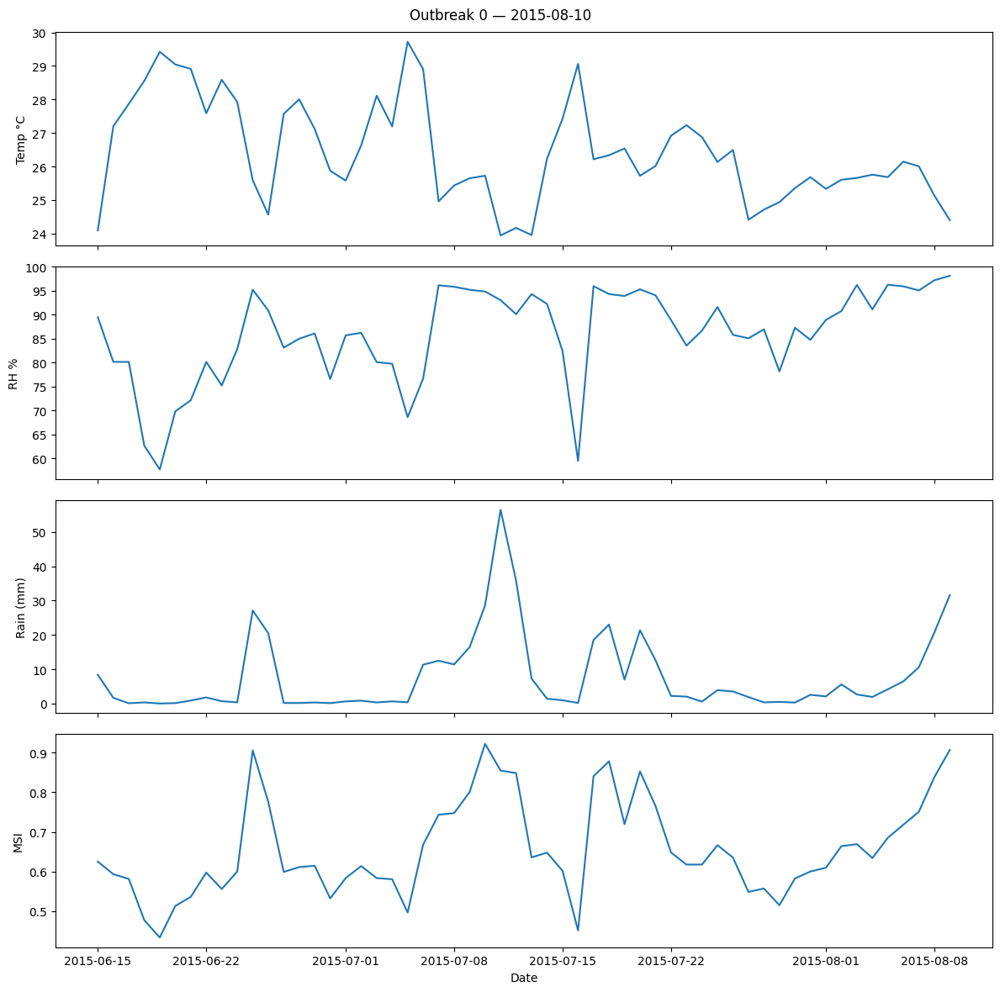

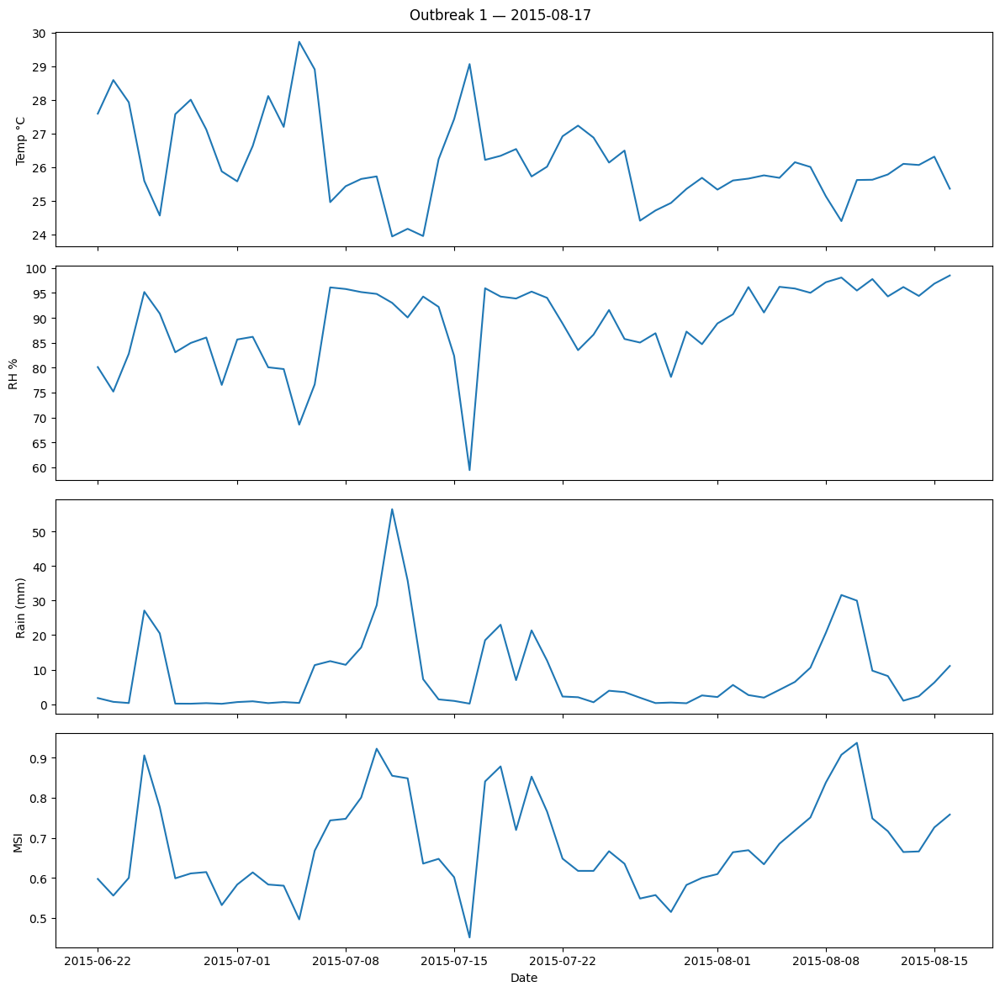

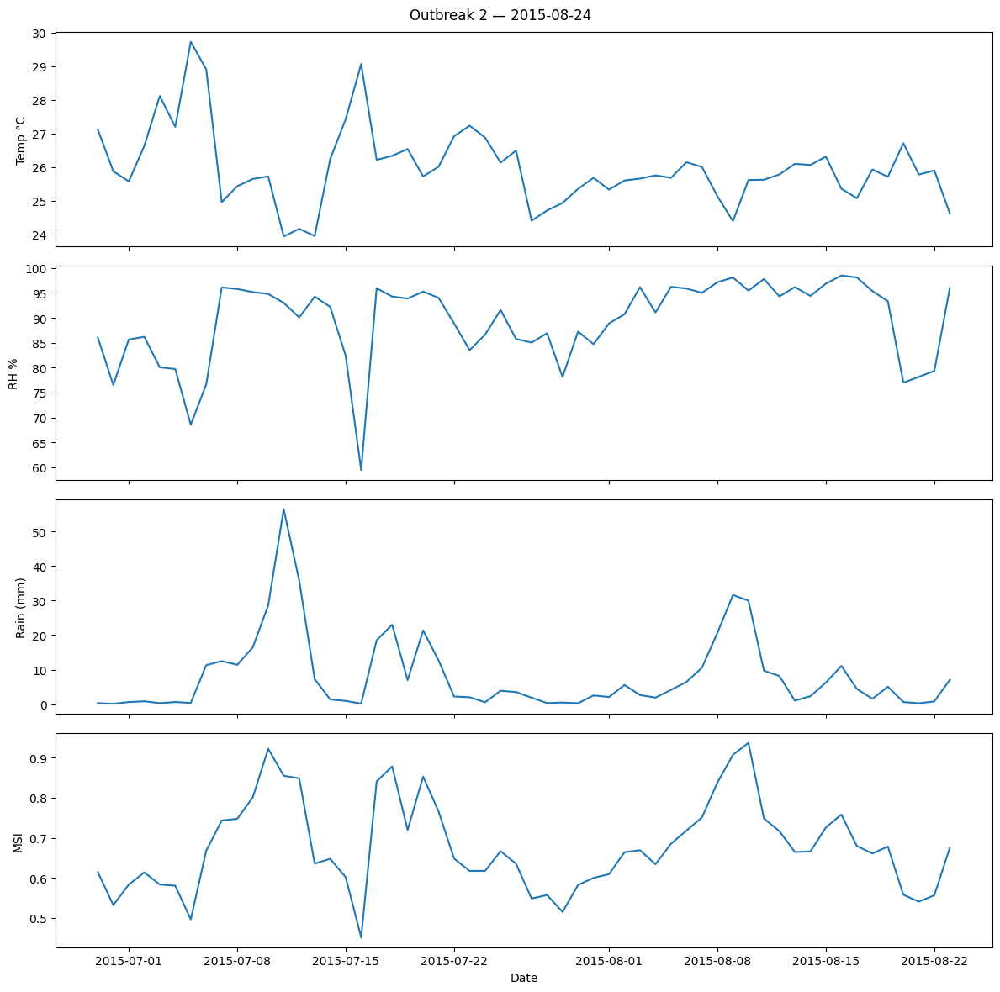

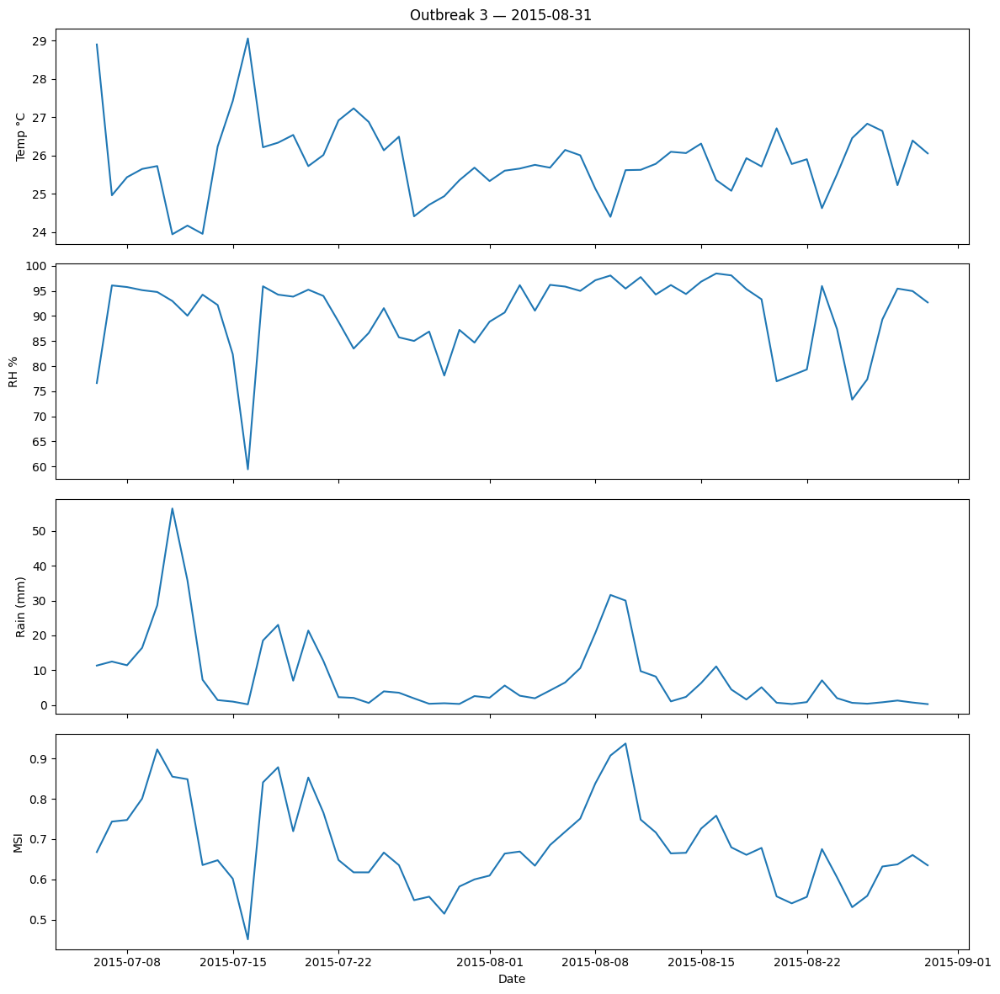

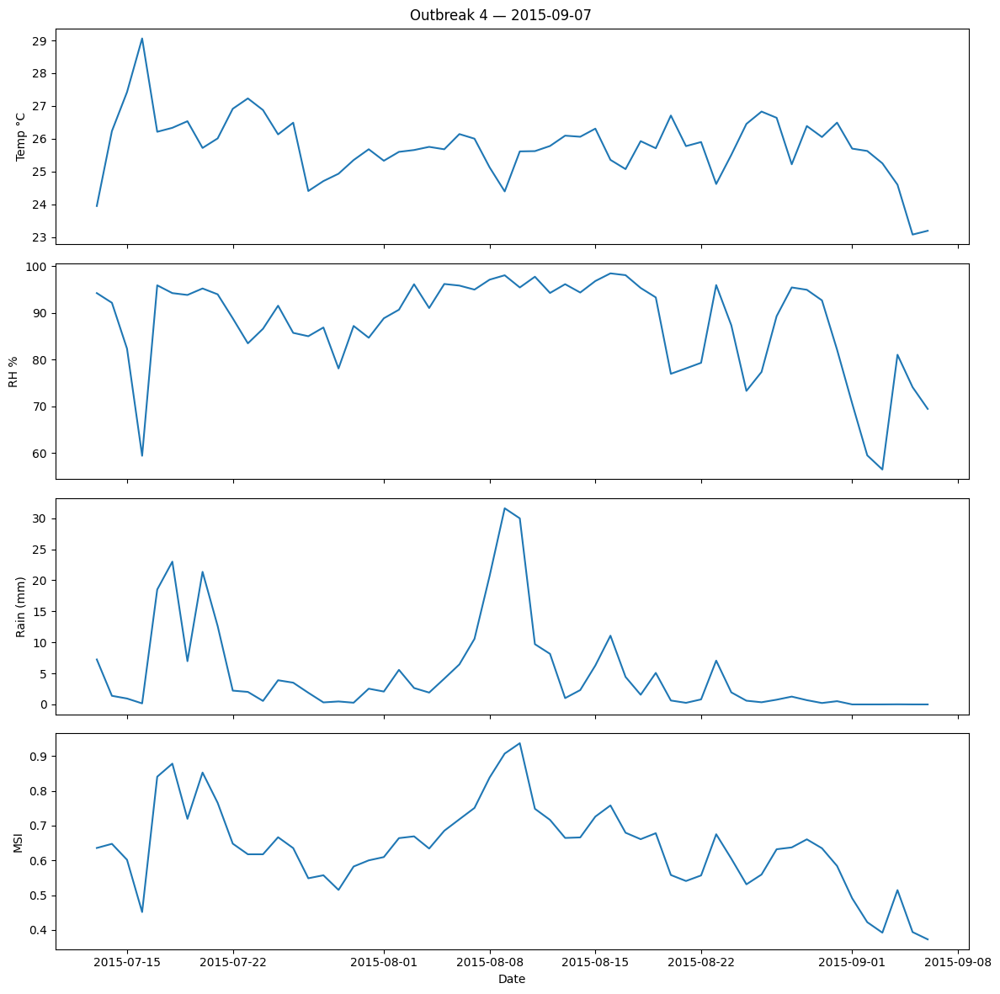

...

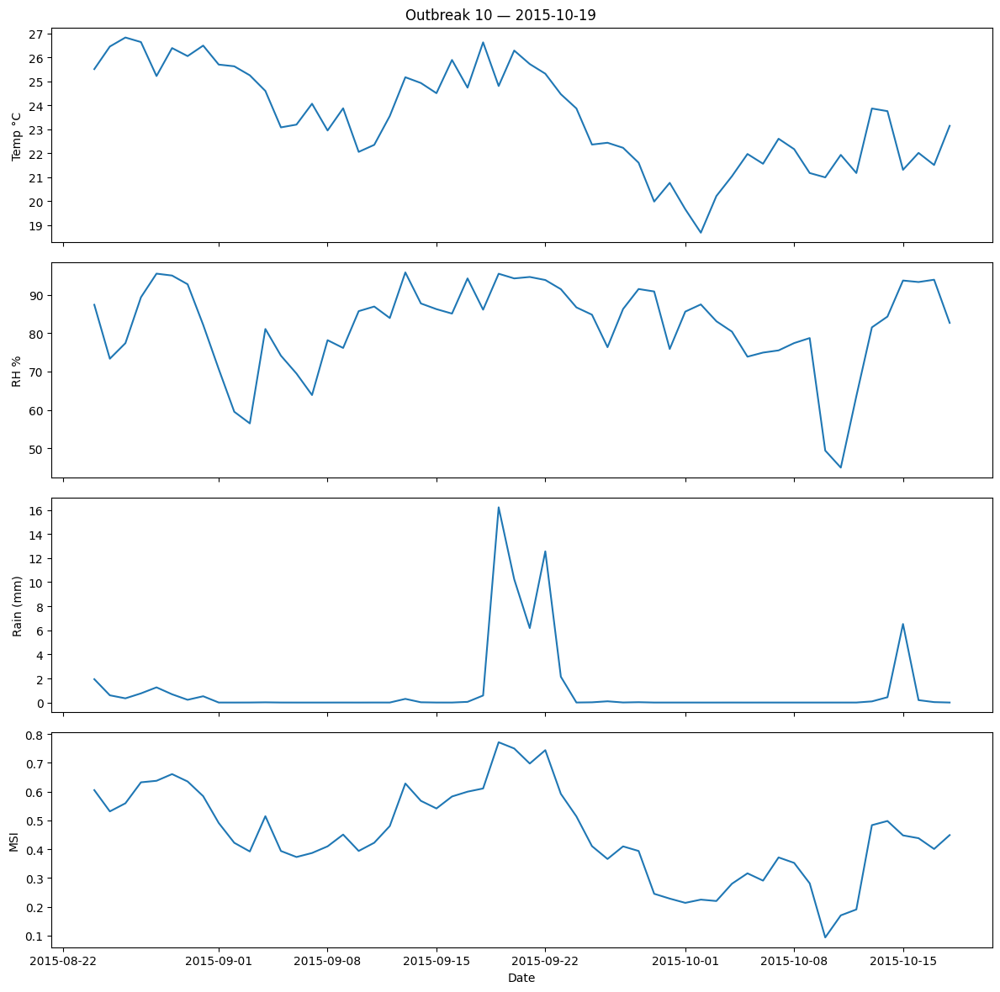

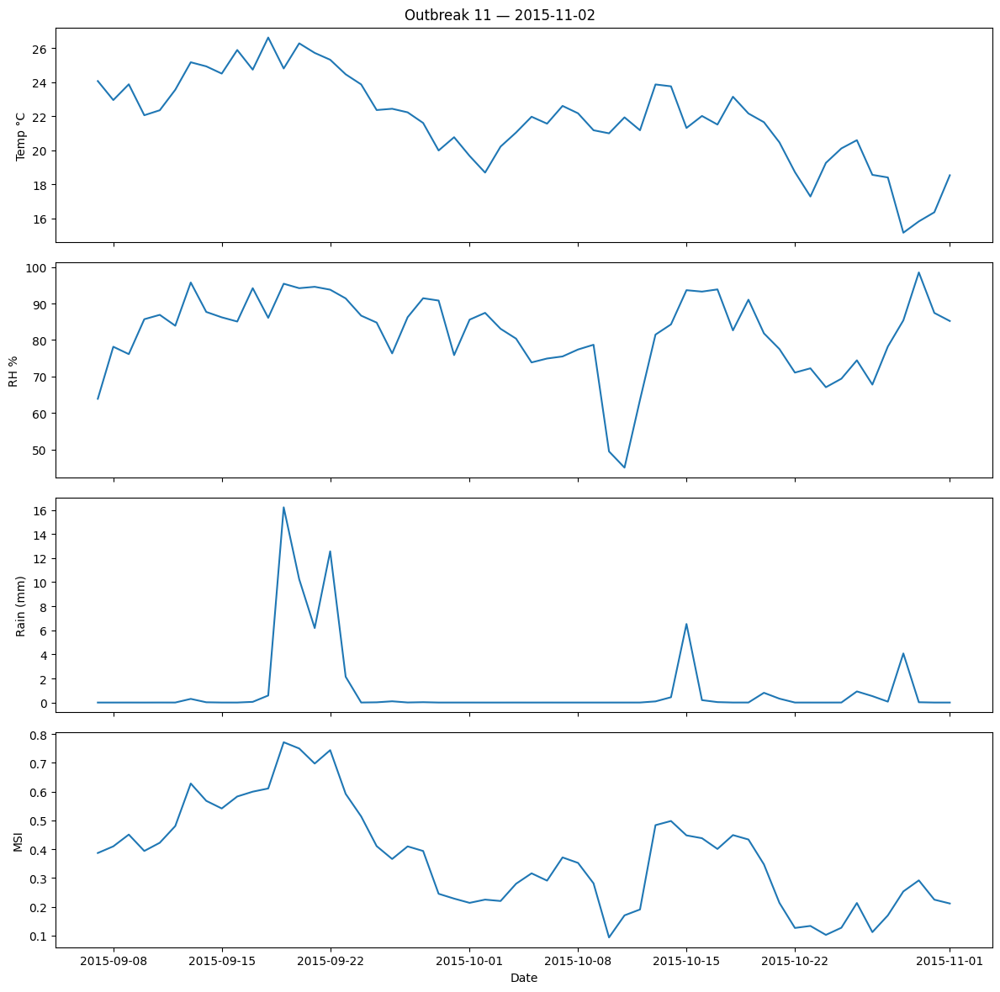

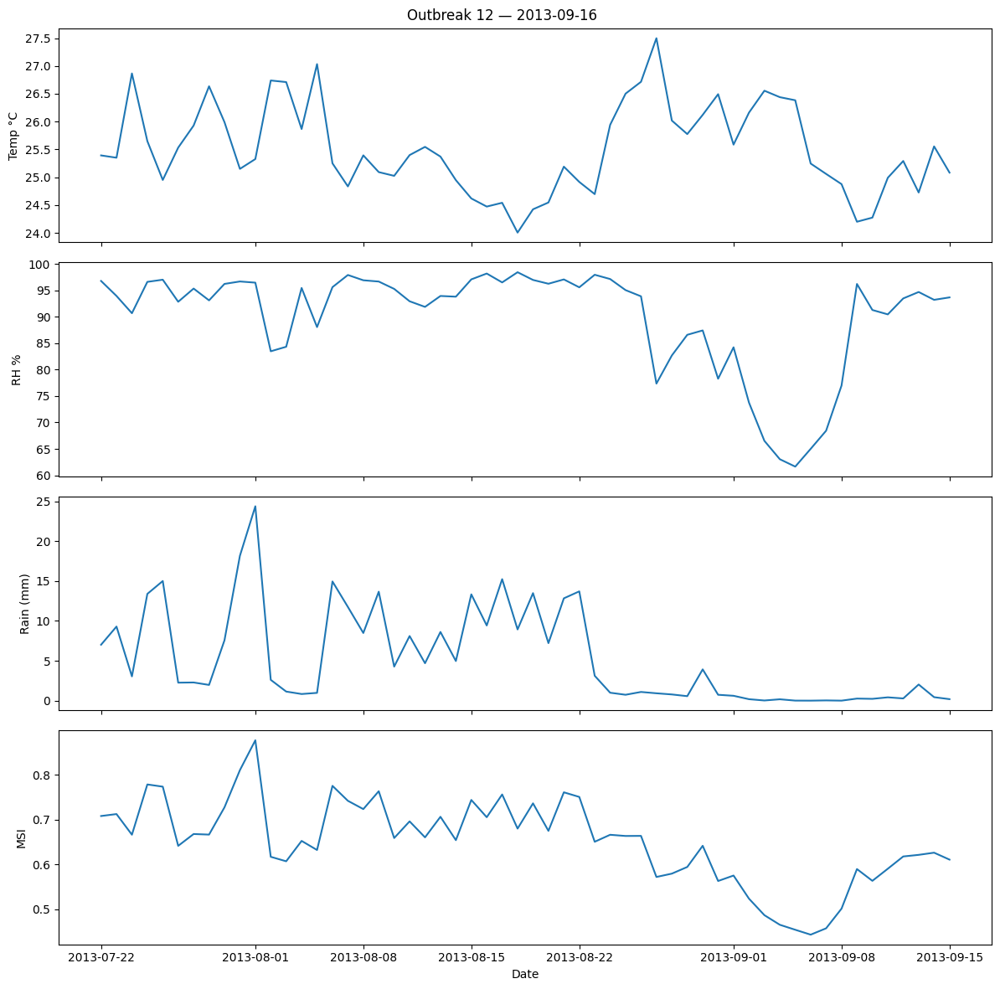

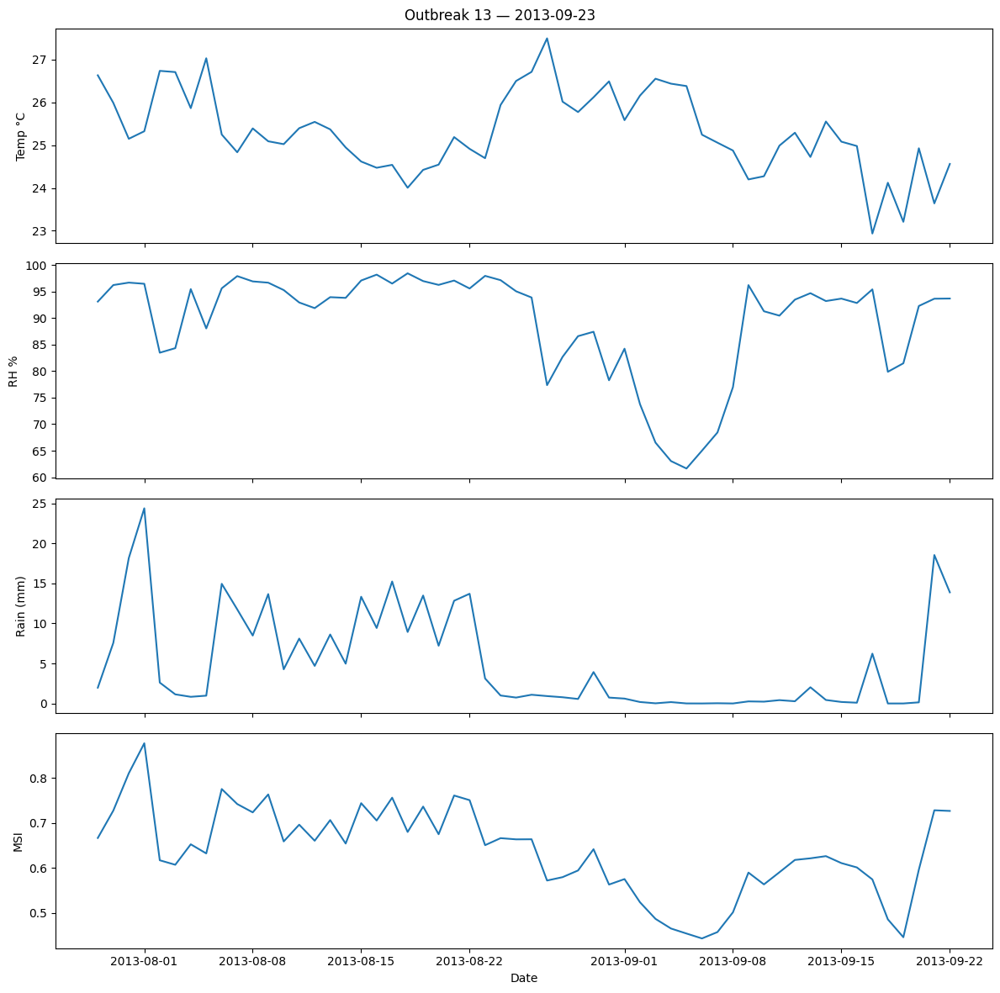

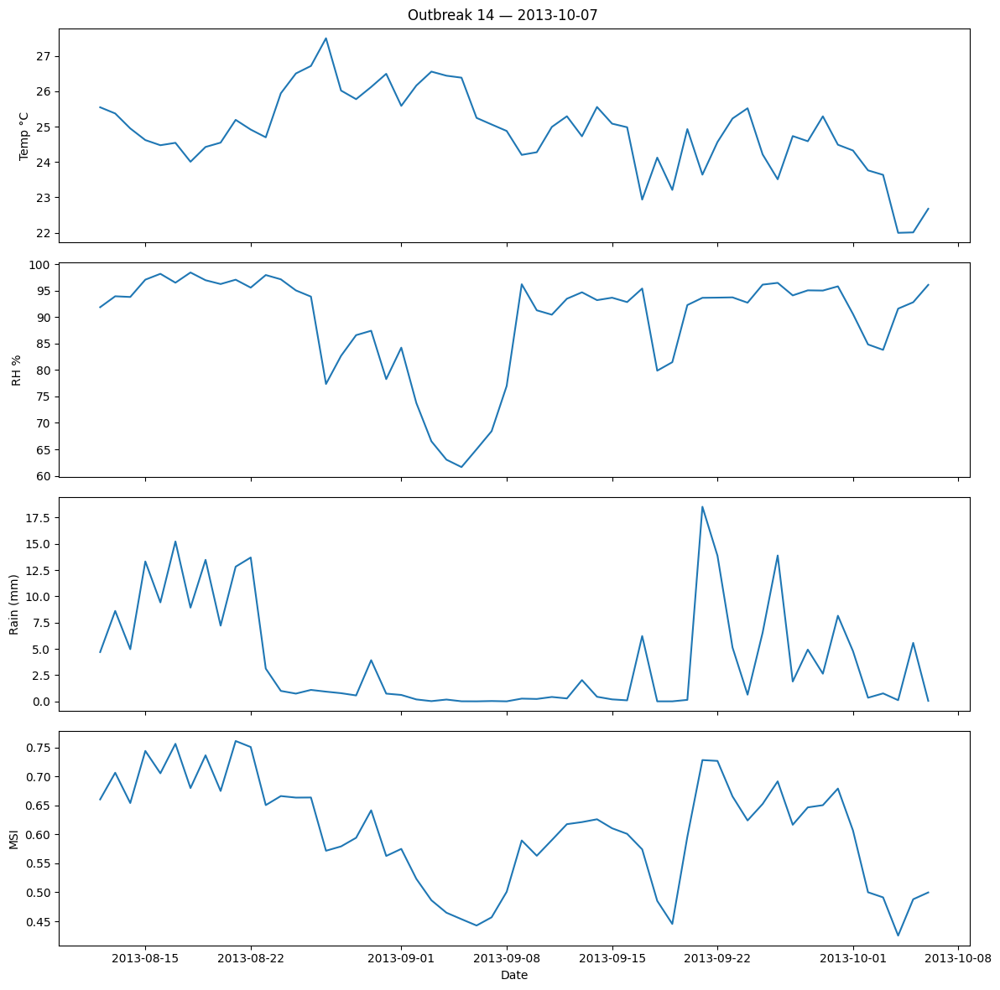

In [ ]:
import seaborn as sns

os.makedirs("outbreak_summary_plots", exist_ok=True)

for oid in df["outbreak_idx"].unique():
    sub = df[df["outbreak_idx"] == oid].sort_values("time")
    date = sub["outbreak_date"].iloc[0].date()
    title = f"Outbreak {oid} — {date}"

    fig, axes = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

    sns.lineplot(ax=axes[0], x=sub["time"], y=sub["temp_C"])
    axes[0].set_ylabel("Temp °C")

    sns.lineplot(ax=axes[1], x=sub["time"], y=sub["RH"])
    axes[1].set_ylabel("RH %")

    sns.lineplot(ax=axes[2], x=sub["time"], y=sub["precip_mm"])
    axes[2].set_ylabel("Rain (mm)")

    sns.lineplot(ax=axes[3], x=sub["time"], y=sub["MSI"])
    axes[3].set_ylabel("MSI")
    axes[3].set_xlabel("Date")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    plt.savefig(f"outbreak_summary_plots/outbreak_{oid}_{date}.png")
    plt.close()


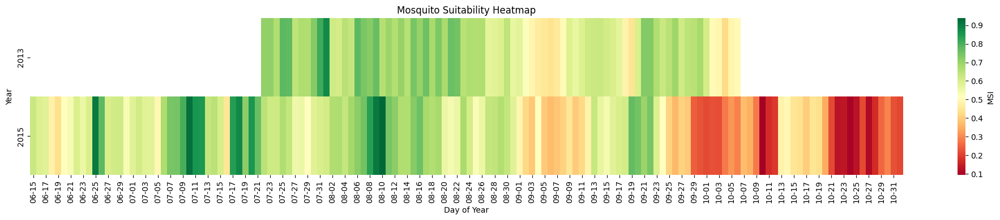

In [ ]:
df_heat = df.copy()
df_heat["date"] = df_heat["time"].dt.date
df_heat = df_heat.pivot_table(values="MSI",
                              index=df_heat["time"].dt.year,
                              columns=df_heat["time"].dt.strftime("%m-%d"),
                              aggfunc="mean")

plt.figure(figsize=(20,4))
sns.heatmap(df_heat, cmap="RdYlGn", cbar_kws={"label": "MSI"})
plt.title("Mosquito Suitability Heatmap")
plt.xlabel("Day of Year")
plt.ylabel("Year")
plt.tight_layout()
plt.savefig("MSI_heatmap.png")
plt.show()


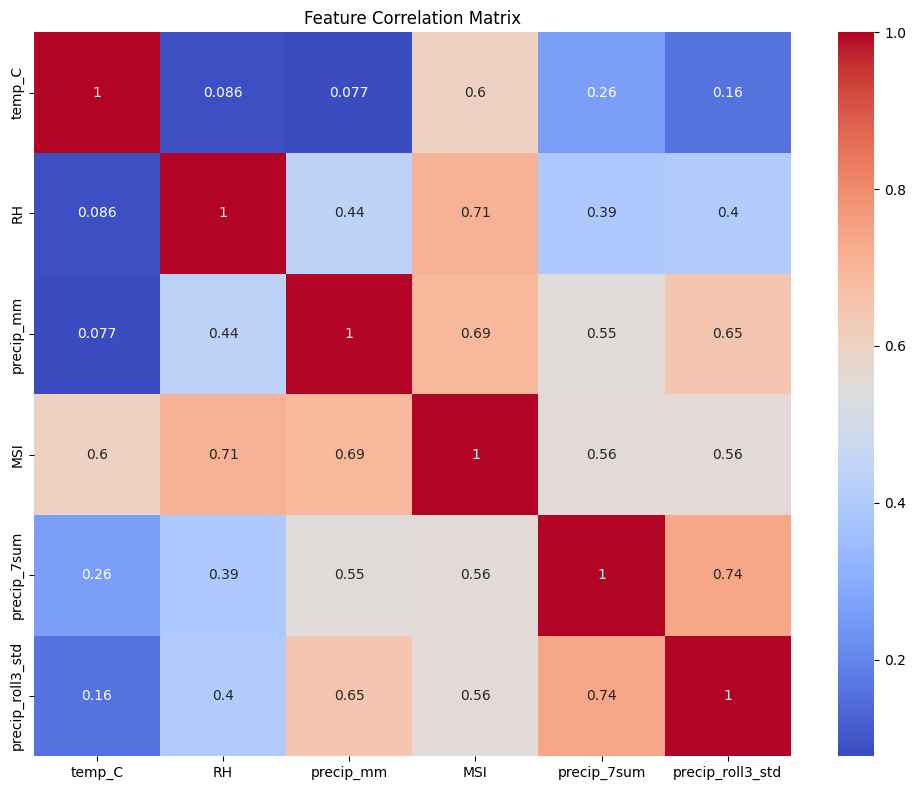

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(df[["temp_C","RH","precip_mm","MSI","precip_7sum","precip_roll3_std"]].corr(),
            annot=True, cmap="coolwarm")
plt.title("Feature Correlation Matrix")
plt.tight_layout()
plt.savefig("correlation_matrix.png")
plt.show()


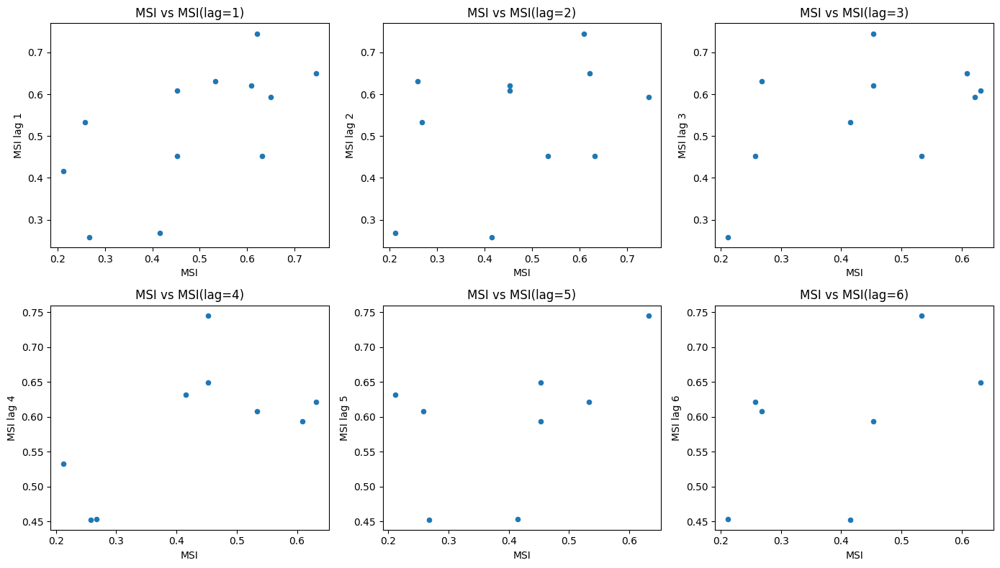

In [ ]:
plt.figure(figsize=(14,8))
lags = 6
for i in range(1, lags+1):
    plt.subplot(2,3,i)
    plt.scatter(series["MSI"], series["MSI"].shift(i), s=20)
    plt.title(f"MSI vs MSI(lag={i})")
    plt.xlabel("MSI")
    plt.ylabel(f"MSI lag {i}")

plt.tight_layout()
plt.savefig("lag_plots_msi.png")
plt.show()


In [ ]:
print(df.columns.tolist())


['time', 'latitude', 'longitude', 't2m', 'tp', 'd2m', 'number', 'temp_C', 'dewpoint_C', 'precip_mm', 'RH', 'outbreak_idx', 'outbreak_date', 'sno', 'week_of_outbreak', 'state_ut', 'district', 'Disease', 'Cases', 'Deaths', 'day', 'mon', 'year', 'Latitude', 'Longitude', 'preci', 'LAI', 'Temp', 'week_num', 'precip_roll3_std', 'precip_7sum', 'stagnation', 'temp_suit', 'rain_suit', 'rh_suit', 'MSI']


In [ ]:
df.head()

,time,latitude,longitude,t2m,tp,d2m,number,temp_C,dewpoint_C,precip_mm,...,LAI,Temp,week_num,precip_roll3_std,precip_7sum,stagnation,temp_suit,rain_suit,rh_suit,MSI
0,2015-06-15,28.6,77.2,297.240967,0.008389,295.392975,0.0,24.090973,22.242981,8.388844,...,5.0,308.545,33,0.000000,8.388844,1,0.761242,0.279628,0.788616,0.624970
1,2015-06-16,28.6,77.2,300.349731,0.001659,296.623016,0.0,27.199738,23.473022,1.659049,...,5.0,308.545,33,4.758684,10.047893,1,0.989993,0.055302,0.602394,0.593306
2,2015-06-17,28.6,77.2,301.017731,0.000081,297.269135,0.0,27.867737,24.119141,0.081488,...,5.0,308.545,33,4.411935,10.129382,1,0.999727,0.002716,0.602051,0.581321
3,2015-06-18,28.6,77.2,301.703796,0.000322,293.876495,0.0,28.553802,20.726501,0.321984,...,5.0,308.545,33,0.849929,10.451366,1,0.995208,0.010733,0.252462,0.477042
4,2015-06-19,28.6,77.2,302.573853,0.000001,293.352173,0.0,29.423859,20.202179,0.001309,...,5.0,308.545,33,0.166883,10.452675,1,0.968322,0.000044,0.153037,0.433253


Outbreaks detected: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]


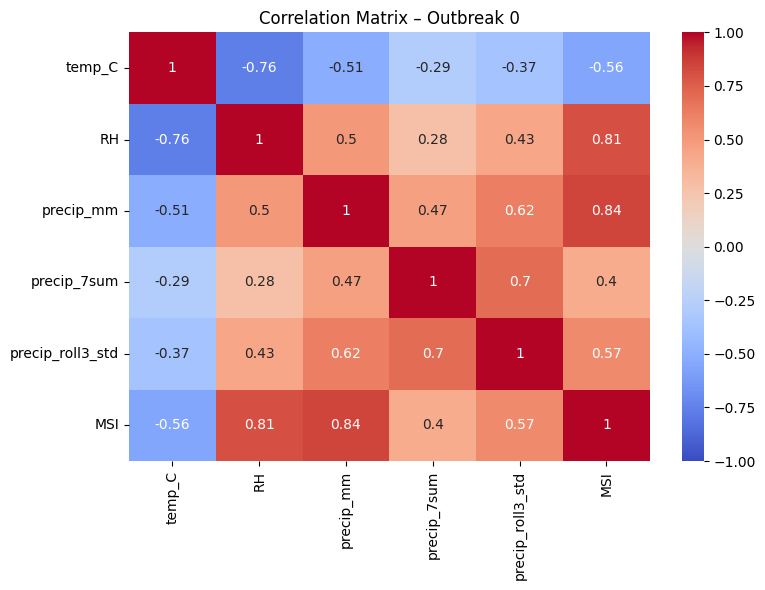

Saved: correlation_outbreak_0.png


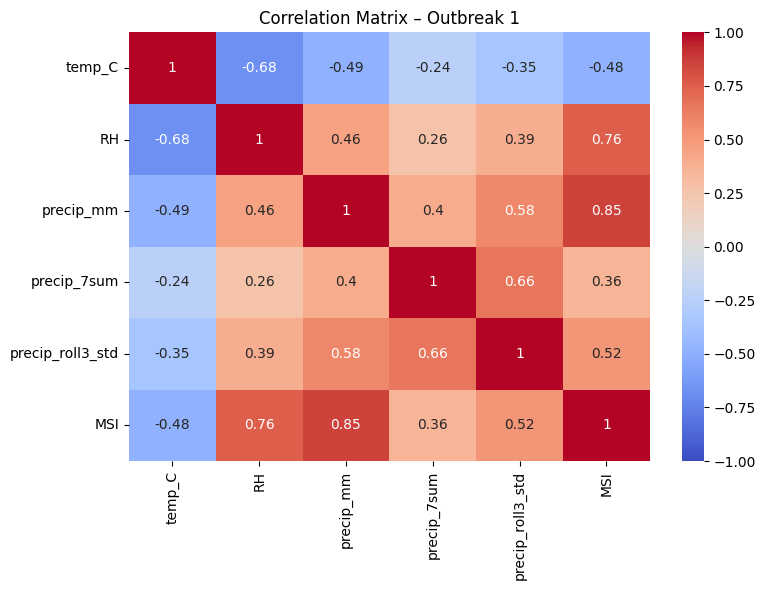

Saved: correlation_outbreak_1.png


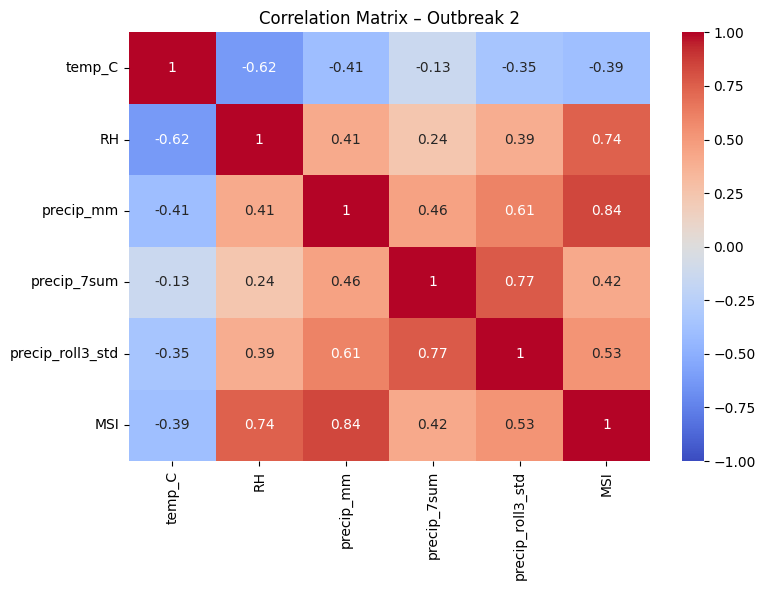

Saved: correlation_outbreak_2.png


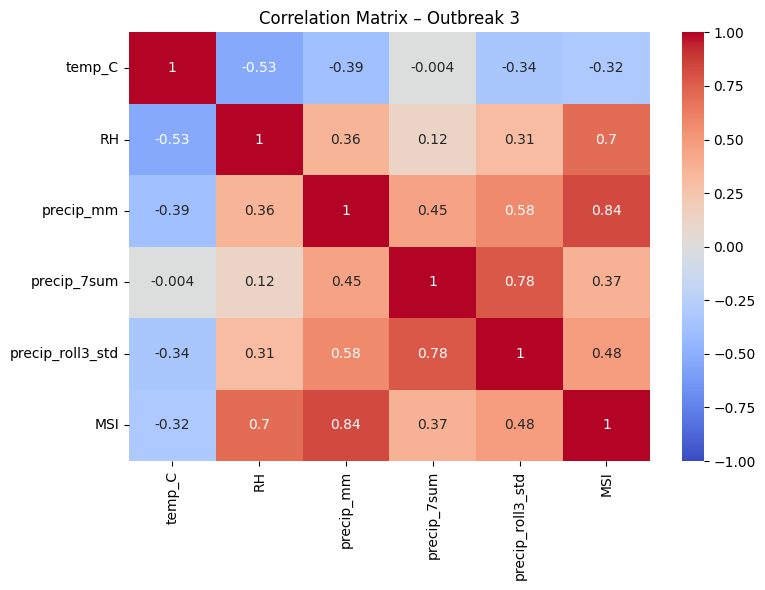

Saved: correlation_outbreak_3.png


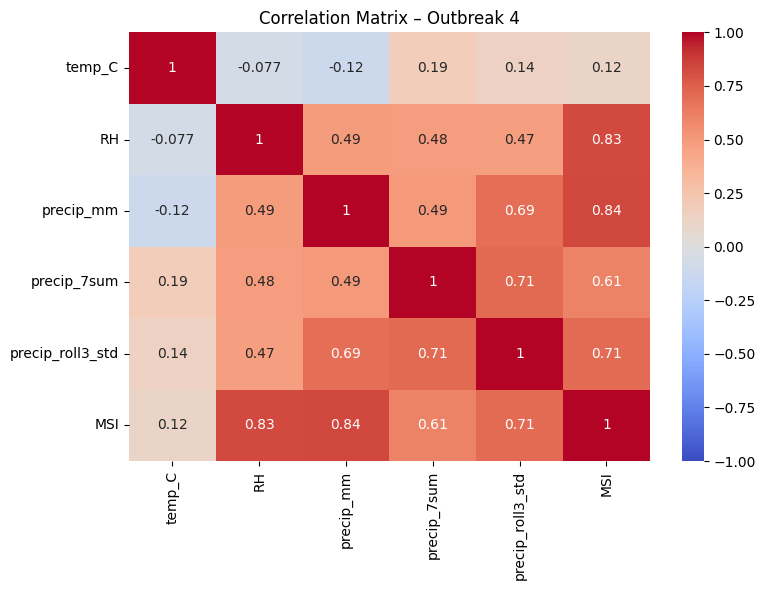

Saved: correlation_outbreak_4.png


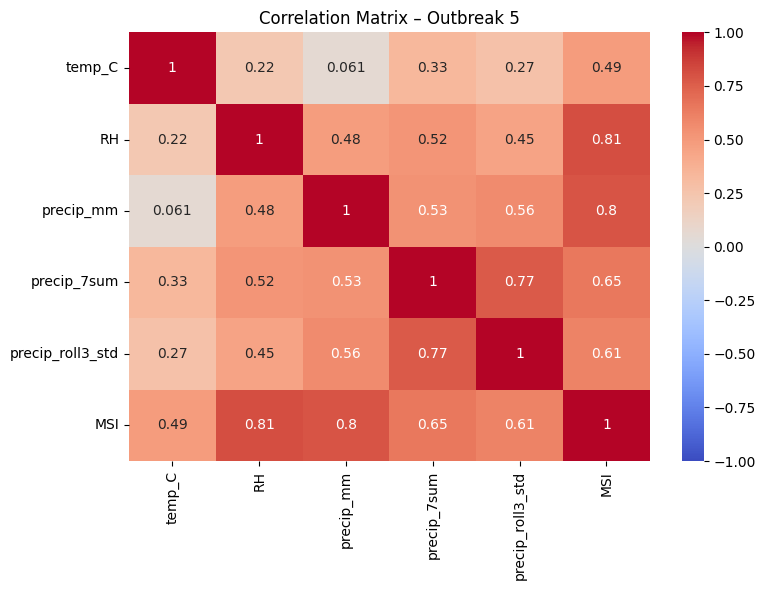

Saved: correlation_outbreak_5.png


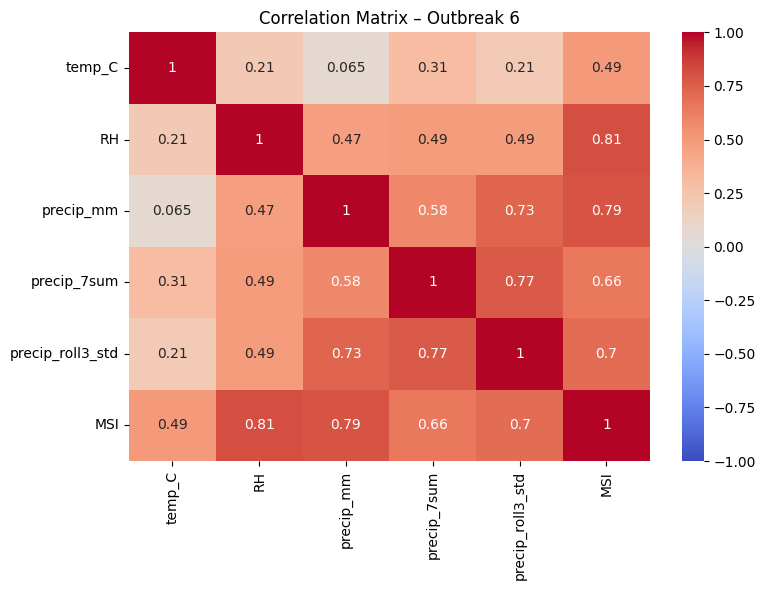

Saved: correlation_outbreak_6.png


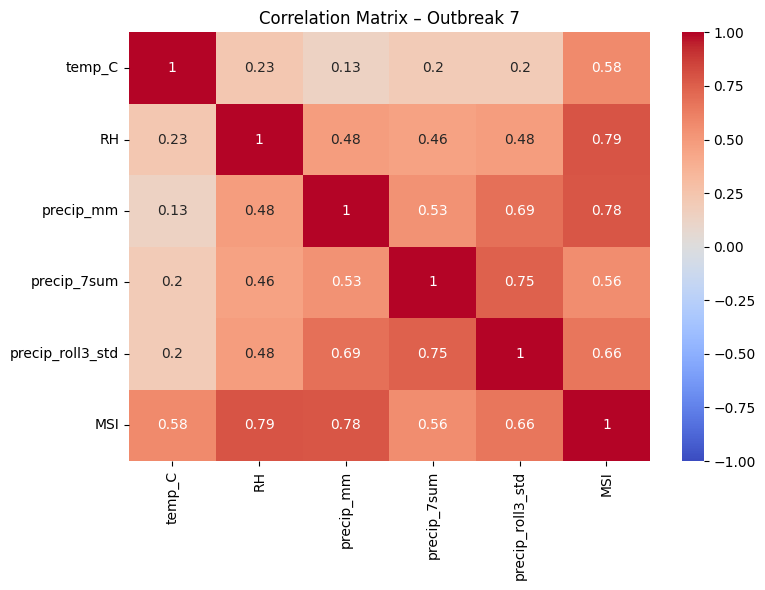

Saved: correlation_outbreak_7.png


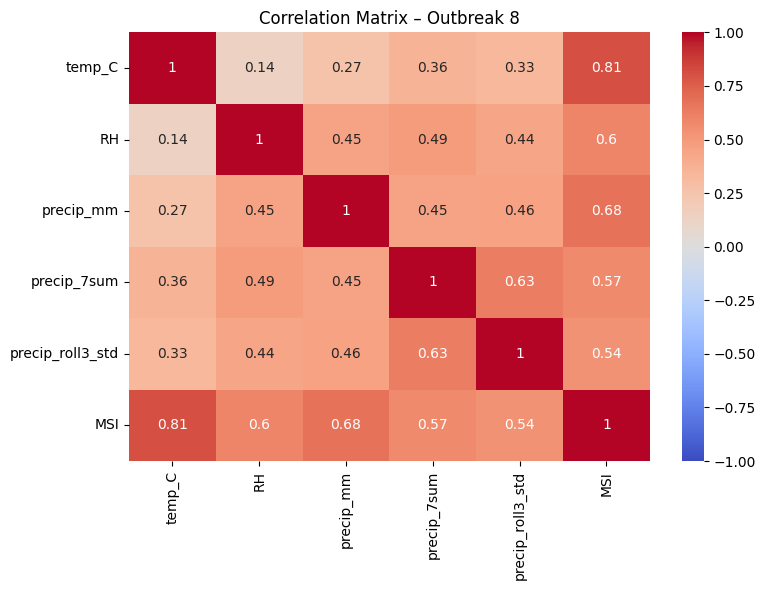

Saved: correlation_outbreak_8.png


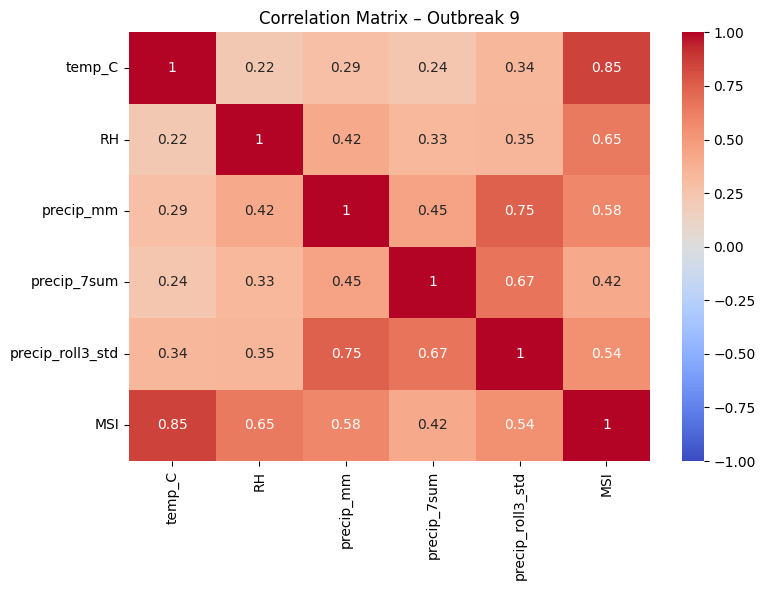

Saved: correlation_outbreak_9.png


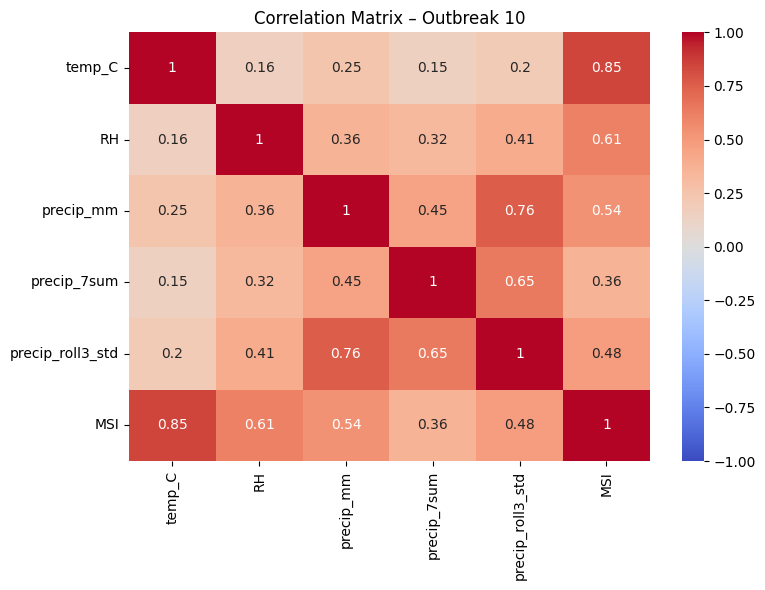

Saved: correlation_outbreak_10.png


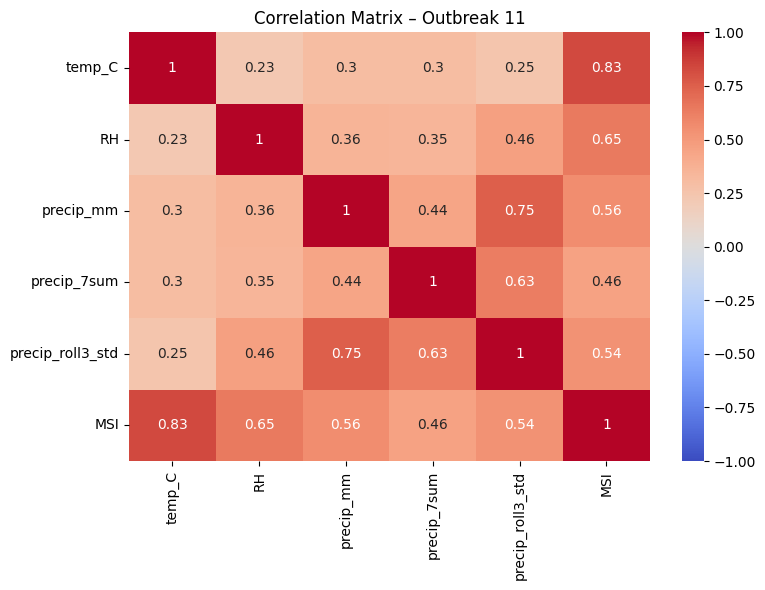

Saved: correlation_outbreak_11.png


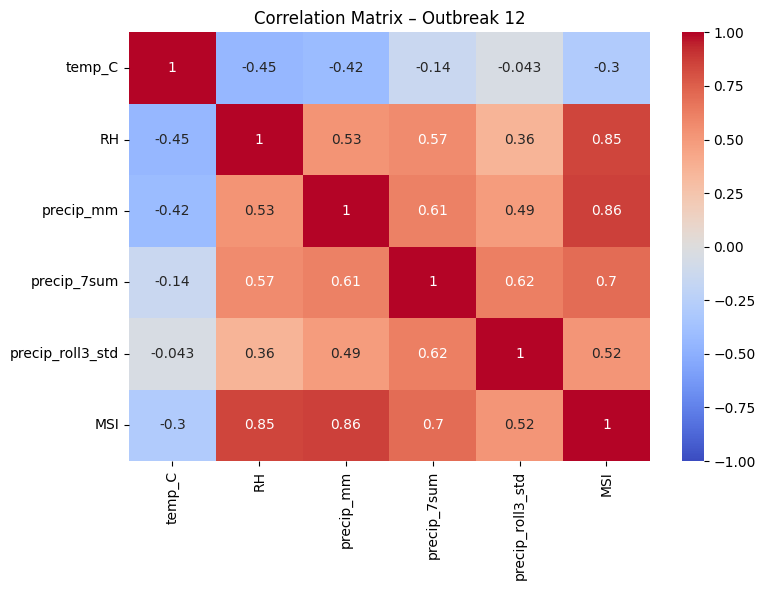

Saved: correlation_outbreak_12.png


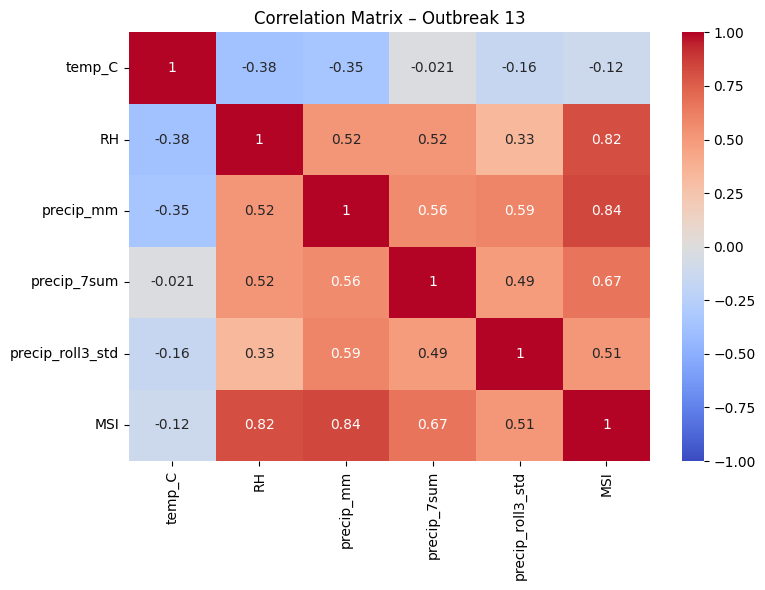

Saved: correlation_outbreak_13.png


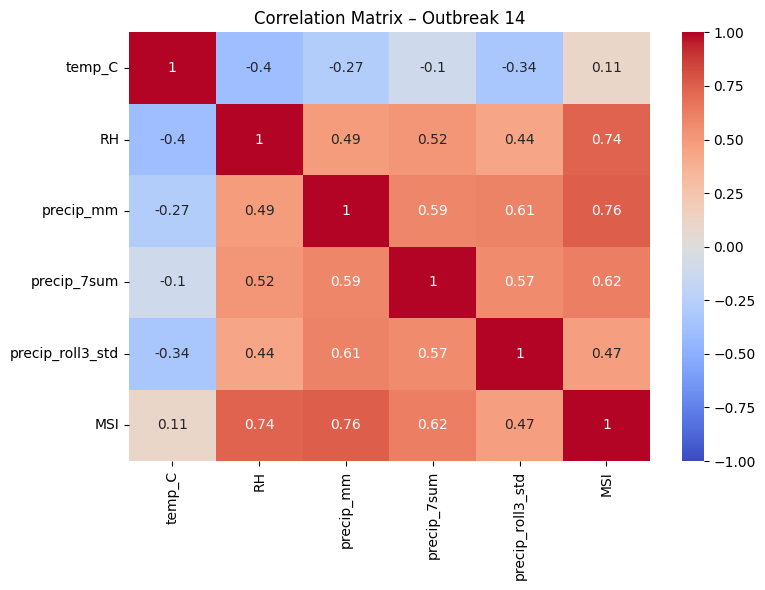

Saved: correlation_outbreak_14.png


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# list of outbreaks
outbreaks = df["outbreak_idx"].unique()
outbreaks = np.sort(outbreaks)

print("Outbreaks detected:", outbreaks)

for oid in outbreaks:
    sub = df[df["outbreak_idx"] == oid].copy()

    # select numeric feature columns
    features = ["temp_C", "RH", "precip_mm", "precip_7sum",
                "precip_roll3_std", "MSI"]

    corr = sub[features].corr()

    # plot heatmap
    plt.figure(figsize=(8,6))
    sns.heatmap(corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
    plt.title(f"Correlation Matrix – Outbreak {oid}")
    plt.tight_layout()
    plt.show()
    # save
    filename = f"correlation_outbreak_{oid}.png"
    plt.savefig(filename)
    plt.close()

    print(f"Saved: {filename}")


In [ ]:
display(df)

,time,latitude,longitude,t2m,tp,d2m,number,temp_C,dewpoint_C,precip_mm,...,LAI,Temp,week_num,precip_roll3_std,precip_7sum,stagnation,temp_suit,rain_suit,rh_suit,MSI
0,2015-06-15,28.6,77.2,297.240967,0.008389,295.392975,0.0,24.090973,22.242981,8.388844,...,5.0,308.545,33,0.000000,8.388844,1,0.761242,0.279628,0.788616,0.624970
1,2015-06-16,28.6,77.2,300.349731,0.001659,296.623016,0.0,27.199738,23.473022,1.659049,...,5.0,308.545,33,4.758684,10.047893,1,0.989993,0.055302,0.602394,0.593306
2,2015-06-17,28.6,77.2,301.017731,0.000081,297.269135,0.0,27.867737,24.119141,0.081488,...,5.0,308.545,33,4.411935,10.129382,1,0.999727,0.002716,0.602051,0.581321
3,2015-06-18,28.6,77.2,301.703796,0.000322,293.876495,0.0,28.553802,20.726501,0.321984,...,5.0,308.545,33,0.849929,10.451366,1,0.995208,0.010733,0.252462,0.477042
4,2015-06-19,28.6,77.2,302.573853,0.000001,293.352173,0.0,29.423859,20.202179,0.001309,...,5.0,308.545,33,0.166883,10.452675,1,0.968322,0.000044,0.153037,0.433253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
835,2013-10-02,28.6,77.2,296.911713,0.000344,294.203888,0.0,23.761719,21.053894,0.344406,...,NaN,308.80666659999997,41,3.917255,36.628003,0,0.719328,0.011480,0.696433,0.500105
836,2013-10-03,28.6,77.2,296.785126,0.000758,293.882599,0.0,23.635132,20.732605,0.758063,...,NaN,308.80666659999997,41,2.453315,23.493819,0,0.702311,0.025269,0.675970,0.491296
837,2013-10-04,28.6,77.2,295.145508,0.000111,293.711700,0.0,21.995514,20.561707,0.110700,...,NaN,308.80666659999997,41,0.327823,21.715946,0,0.436659,0.003690,0.831684,0.425276
838,2013-10-05,28.6,77.2,295.157776,0.005569,293.937042,0.0,22.007782,20.787048,5.569390,...,NaN,308.80666659999997,41,2.982316,22.356151,0,0.438958,0.185646,0.855896,0.488046


In [ ]:


# Load MODIS LAI
lai = pd.read_csv("/content/Delhi_LAI_8day.csv")

lai['date'] = pd.to_datetime(lai['date'])
lai = lai[['date','LAI']].sort_values('date')

# DAILY interpolation
lai_daily = lai.set_index('date').resample('D').interpolate(method='linear')

lai_daily = lai_daily.reset_index()
print(lai_daily.head(), lai_daily.tail())

lai_daily.to_csv("Delhi_LAI_daily.csv", index=False)
print("Saved Delhi_LAI_daily.csv")

        date       LAI
0 2010-01-01  0.175702
1 2010-01-02  0.201132
2 2010-01-03  0.226561
3 2010-01-04  0.251990
4 2010-01-05  0.277419            date       LAI
5473 2024-12-26  0.284719
5474 2024-12-27  0.272476
5475 2024-12-28  0.260233
5476 2024-12-29  0.247990
5477 2024-12-30  0.235747
Saved Delhi_LAI_daily.csv


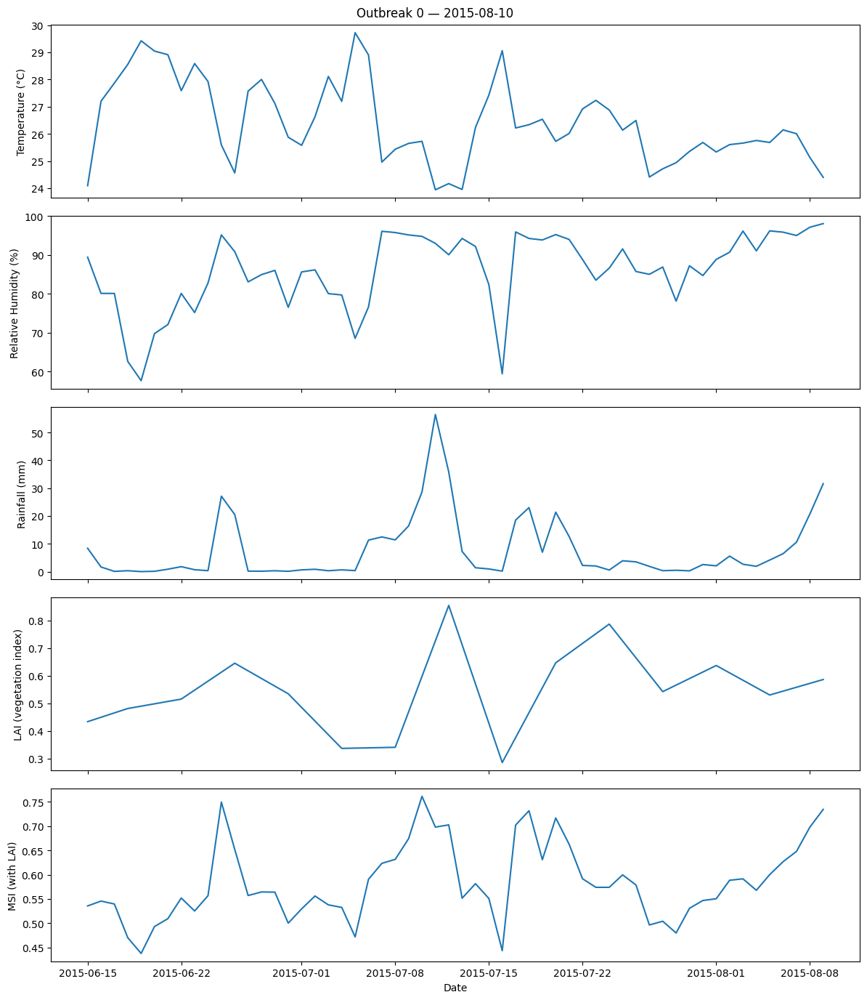

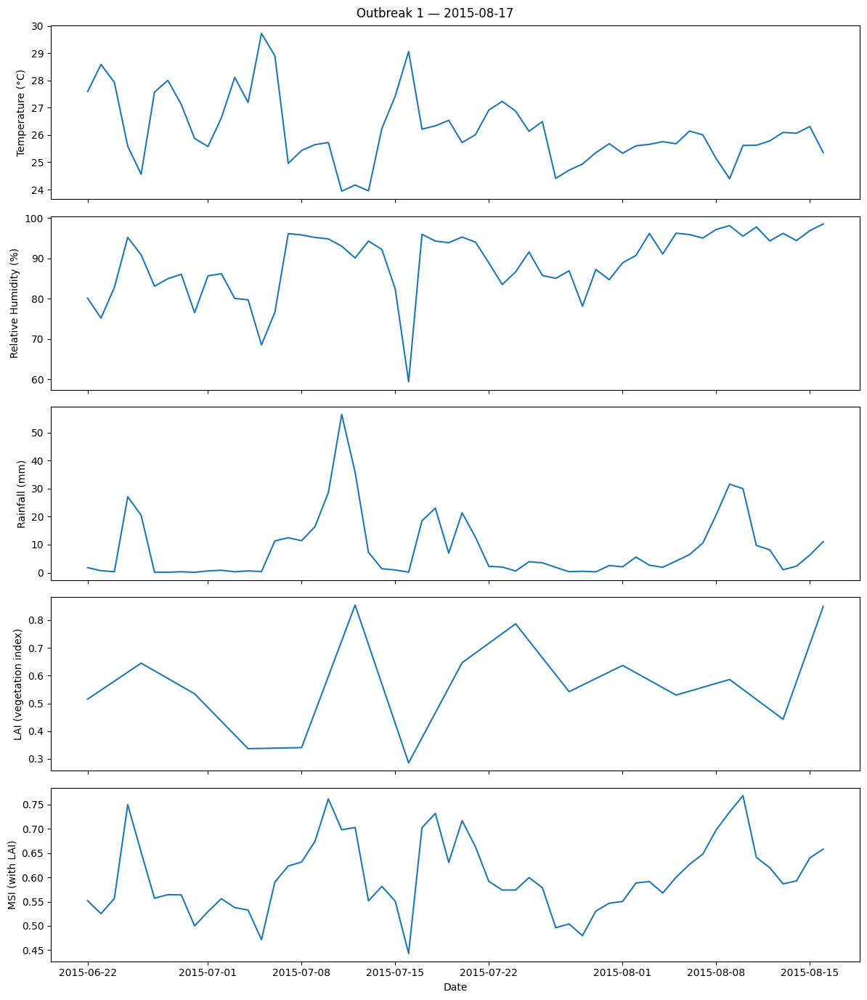

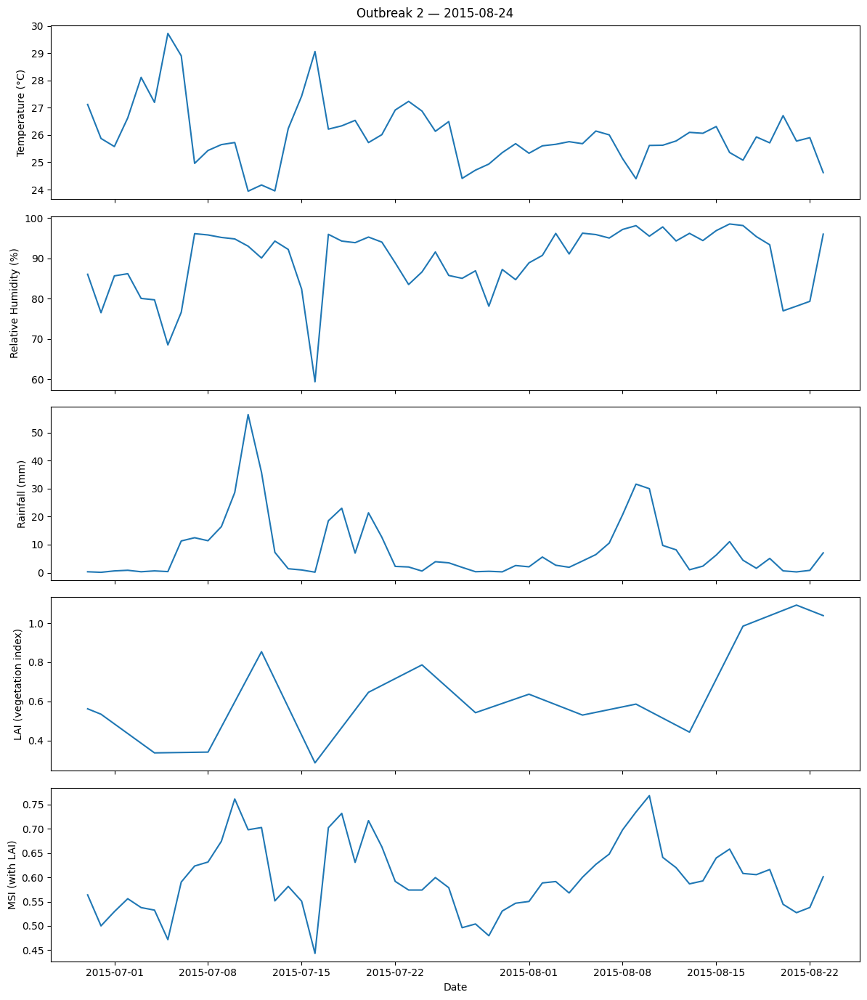

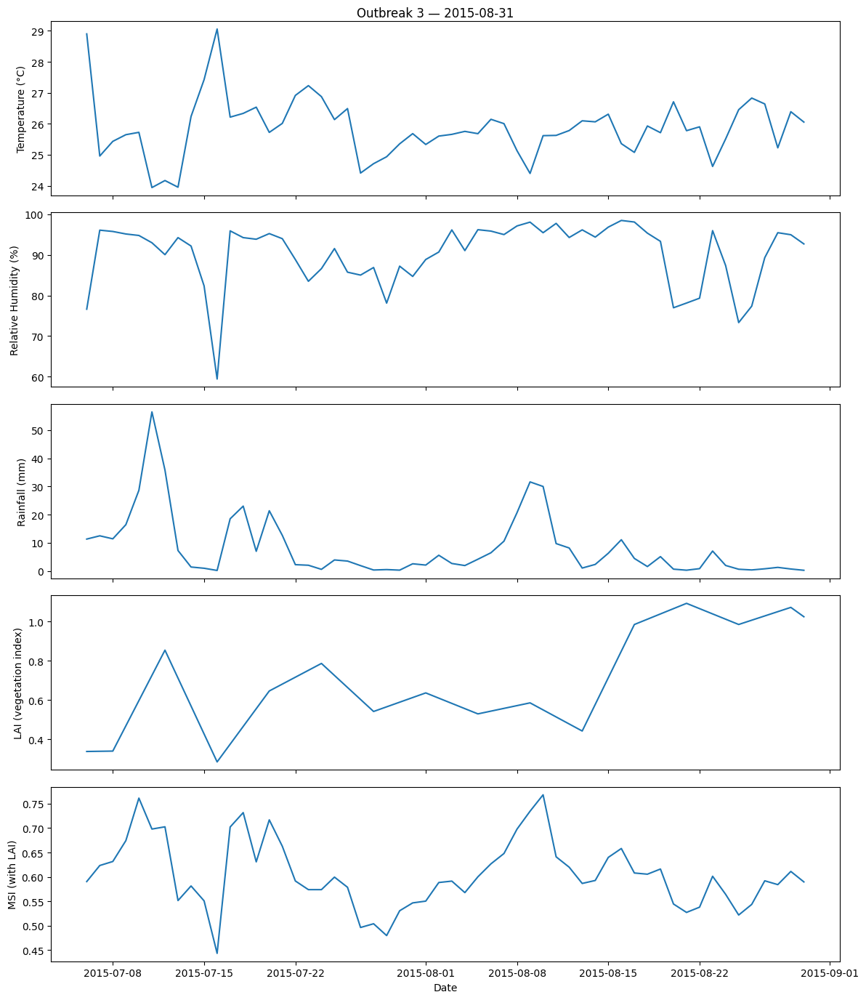

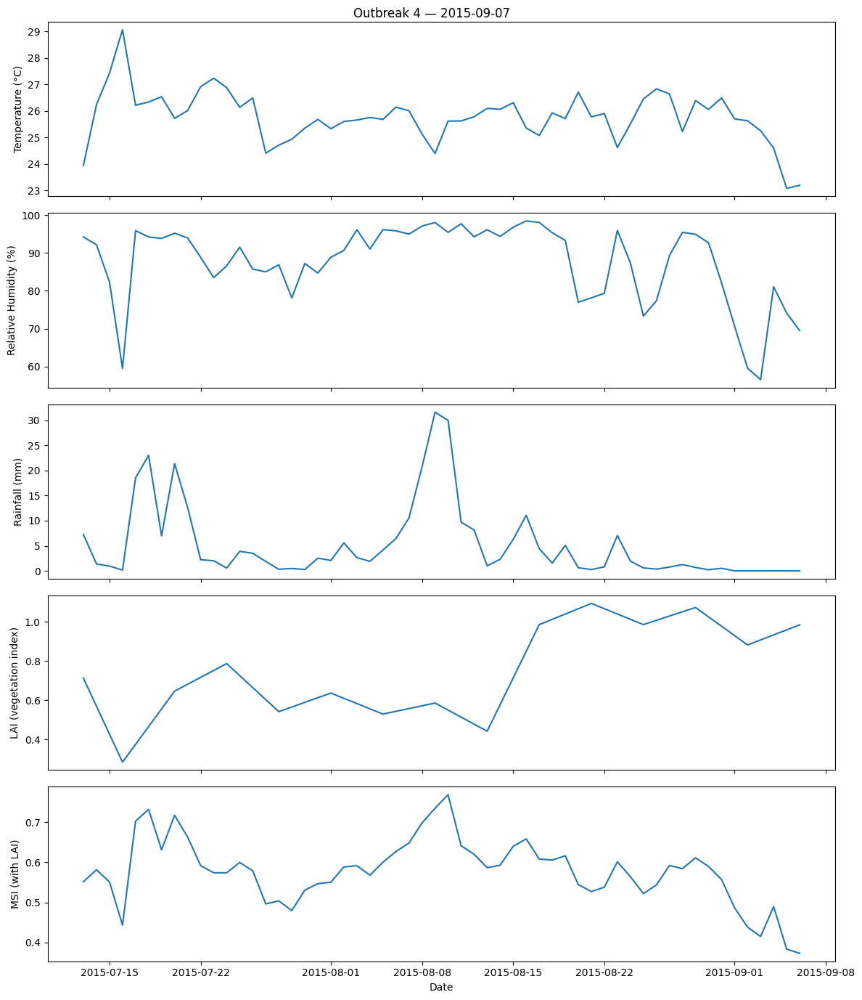

...

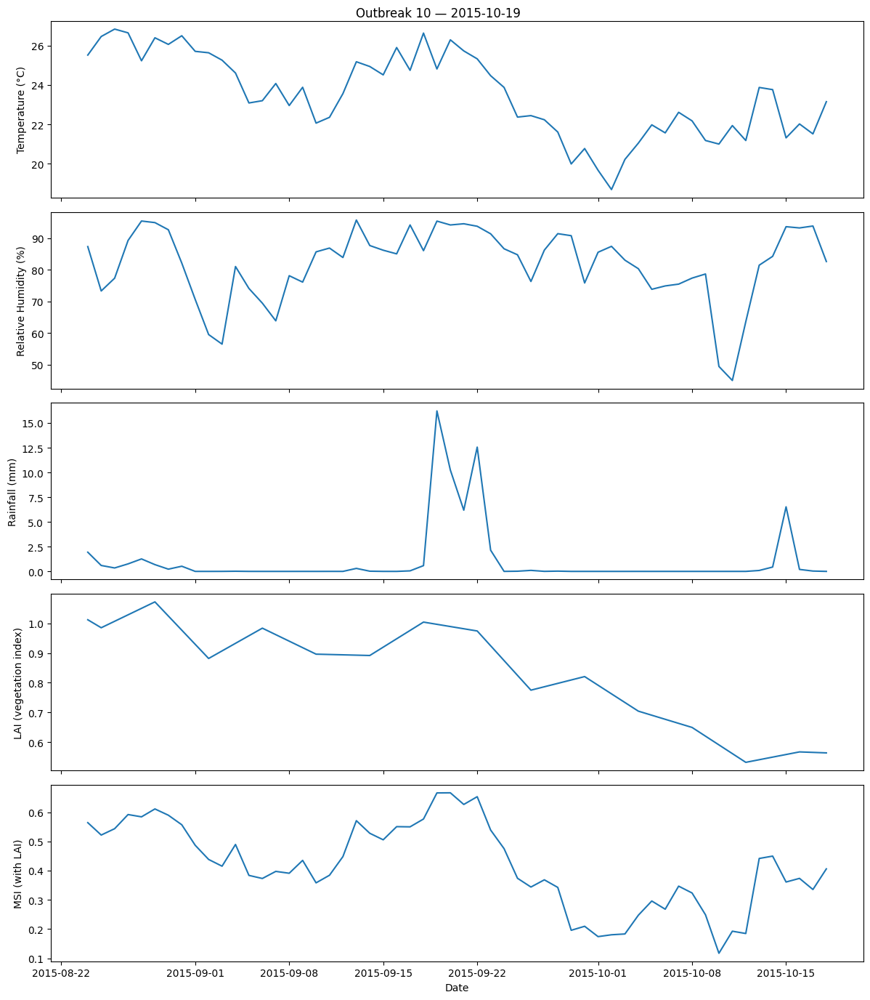

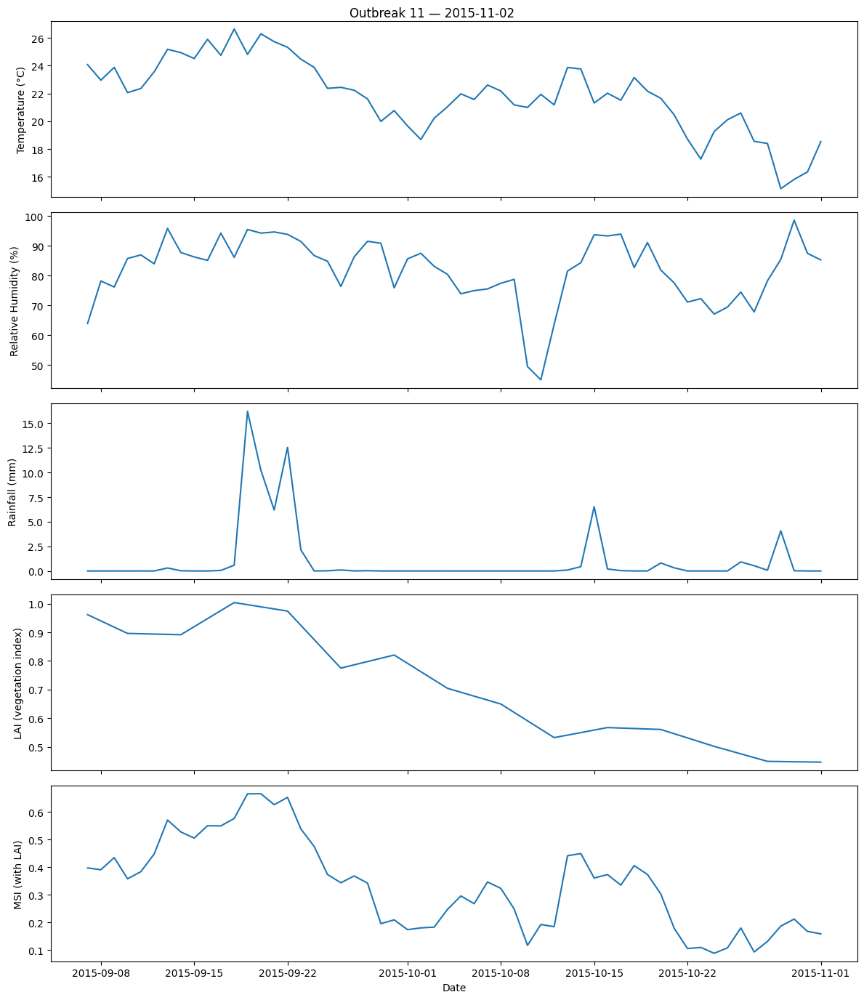

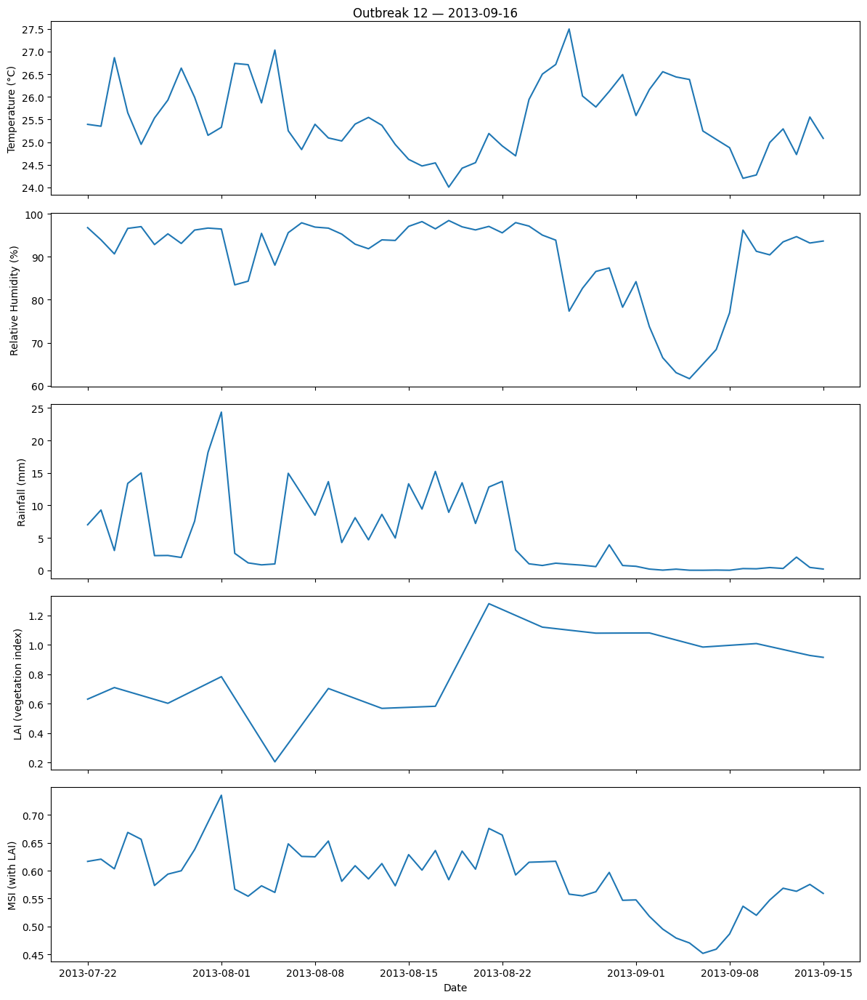

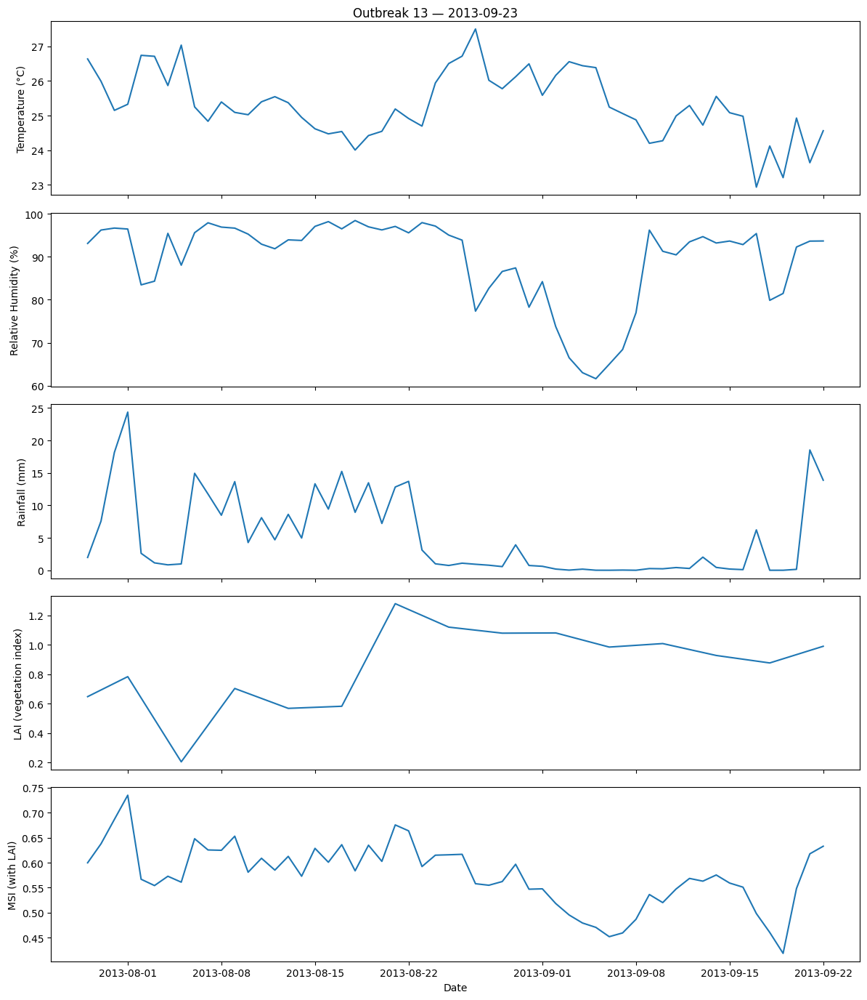

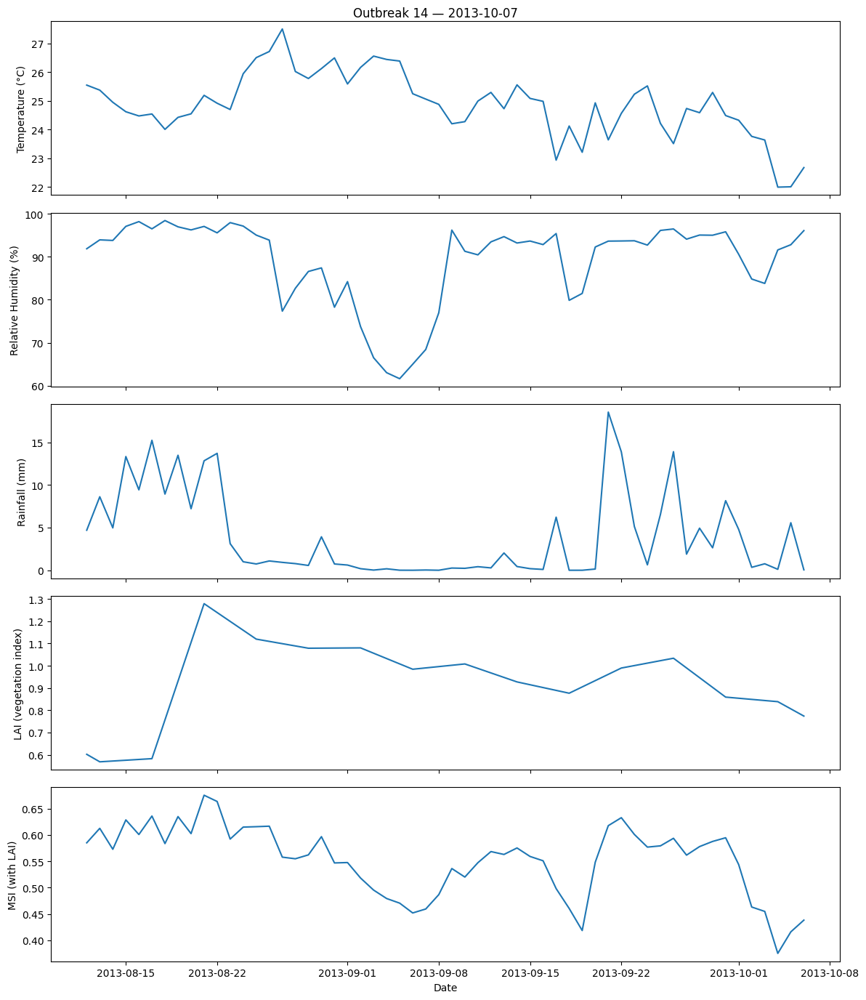

All LAI-environment-MSI plots saved inside `outbreak_plots_lai/`


In [ ]:

# LOAD FINAL MERGED DATA
# -----------------------------
df = pd.read_csv("/content/final_with_LAI.csv", parse_dates=["time"])
df['outbreak_date'] = pd.to_datetime(df['outbreak_date'])

# -----------------------------
# FIX LAI (missing values forward/backward fill)
# -----------------------------
df["LAI"] = df["LAI"].replace({None: np.nan})
df["LAI"] = df["LAI"].astype(float)
df["LAI"] = df["LAI"].interpolate().bfill().ffill()


# -----------------------------
# NORMALIZED SUITABILITY FUNCTIONS
# -----------------------------
def temp_suit(T):
    return np.clip(1 - ((T - 28) / 8) ** 2, 0, 1)

def rh_suit(r):
    return np.clip((r - 50) / 50, 0, 1)

def rain_suit(p):
    return np.clip(p / 30, 0, 1)

def lai_suit(l):
    return np.clip(l / 5, 0, 1)    # LAI 0–5 typical range


# -----------------------------
# COMPUTE SUITABILITIES
# -----------------------------
df["temp_suit"] = df["temp_C"].apply(temp_suit)
df["rh_suit"]   = df["RH"].apply(rh_suit)
df["rain_suit"] = df["precip_mm"].apply(rain_suit)
df["lai_suit"]  = df["LAI"].apply(lai_suit)

# -----------------------------
# NEW MSI (WITH LAI WEIGHTED)
# -----------------------------
df["MSI_new"] = (
    0.40 * df["temp_suit"] +
    0.20 * df["rh_suit"] +
    0.20 * df["rain_suit"] +
    0.20 * df["lai_suit"]
)

df["MSI_new"] = df["MSI_new"].clip(0, 1)


# ==============================
# PLOTTING FOR EACH OUTBREAK
# ==============================
os.makedirs("outbreak_plots_lai", exist_ok=True)

for oid in df["outbreak_idx"].unique():

    sub = df[df["outbreak_idx"] == oid].sort_values("time")
    outbreak_date = sub["outbreak_date"].iloc[0].date()

    fig, axes = plt.subplots(5, 1, figsize=(12, 14), sharex=True)

    sns.lineplot(ax=axes[0], x=sub["time"], y=sub["temp_C"])
    axes[0].set_ylabel("Temperature (°C)")

    sns.lineplot(ax=axes[1], x=sub["time"], y=sub["RH"])
    axes[1].set_ylabel("Relative Humidity (%)")

    sns.lineplot(ax=axes[2], x=sub["time"], y=sub["precip_mm"])
    axes[2].set_ylabel("Rainfall (mm)")

    sns.lineplot(ax=axes[3], x=sub["time"], y=sub["LAI"])
    axes[3].set_ylabel("LAI (vegetation index)")

    sns.lineplot(ax=axes[4], x=sub["time"], y=sub["MSI_new"])
    axes[4].set_ylabel("MSI (with LAI)")
    axes[4].set_xlabel("Date")

    plt.suptitle(f"Outbreak {oid} — {outbreak_date}")
    plt.tight_layout()

    plt.savefig(f"outbreak_plots_lai/outbreak_{oid}_{outbreak_date}_LAI.png")
    plt.show()
    plt.close()

print("All LAI-environment-MSI plots saved inside `outbreak_plots_lai/`")

In [ ]:
import itertools

INPUT_PATH = "/content/final_with_LAI.csv"
OUTDIR = "/content/outbreak_analysis_outputs"
os.makedirs(OUTDIR, exist_ok=True)
os.makedirs(os.path.join(OUTDIR,"plots_time_series"), exist_ok=True)
os.makedirs(os.path.join(OUTDIR,"plots_lags"), exist_ok=True)
os.makedirs(os.path.join(OUTDIR,"plots_corr"), exist_ok=True)

# Load dataframe
df = pd.read_csv(INPUT_PATH)
# normalize time column
time_col = None
for c in ["time","date","datetime","Date","date_time"]:
    if c in df.columns:
        time_col = c
        break
if time_col is None:
    raise ValueError("No time/date column found in dataframe columns: " + ", ".join(df.columns))
df[time_col] = pd.to_datetime(df[time_col])
df = df.sort_values(time_col).reset_index(drop=True)
df.rename(columns={time_col: "time"}, inplace=True)

# Check expected columns, try common names
for col in ["temp_C","RH","precip_mm","LAI","cases","outbreak_idx","outbreak_date"]:
    if col not in df.columns:
        # attempt alternatives
        if col=="temp_C":
            for alt in ["t2m","temp","temperature","T2M","temp_K"]:
                if alt in df.columns:
                    if alt=="temp_K" or alt=="t2m" or alt=="temp_K":
                        # convert K to C
                        df["temp_C"] = df[alt] - 273.15
                    else:
                        df["temp_C"] = df[alt]
                    break
        if col=="precip_mm":
            for alt in ["precip_mm","tp","precip","rain","rain_mm"]:
                if alt in df.columns:
                    if alt=="tp": df["precip_mm"] = df[alt]*1000.0
                    else: df["precip_mm"] = df[alt]
                    break
        if col=="RH":
            if "RH" not in df.columns and "rh" in df.columns:
                df["RH"] = df["rh"]
        if col=="LAI":
            for alt in ["LAI","lai","LAI_interp","LAI_daily"]:
                if alt in df.columns:
                    df["LAI"] = df[alt]
                    break
        if col=="cases":
            for alt in ["Cases","cases","cases_week","case_count"]:
                if alt in df.columns:
                    df["cases"] = df[alt]
                    break
        if col=="outbreak_idx":
            for alt in ["outbreak_idx","sno","id"]:
                if alt in df.columns:
                    df["outbreak_idx"] = df[alt]
                    break
        if col=="outbreak_date":
            for alt in ["outbreak_date","date_of_outbreak","outbreak_day"]:
                if alt in df.columns:
                    df["outbreak_date"] = pd.to_datetime(df[alt])
                    break

# Final check for necessary columns
missing = [c for c in ["temp_C","RH","precip_mm","LAI","outbreak_idx","outbreak_date"] if c not in df.columns]
if missing:
    raise ValueError("Missing required columns in input file: " + ", ".join(missing))

# Ensure numeric types
df["temp_C"] = pd.to_numeric(df["temp_C"], errors="coerce")
df["RH"] = pd.to_numeric(df["RH"], errors="coerce")
df["precip_mm"] = pd.to_numeric(df["precip_mm"], errors="coerce")
df["LAI"] = pd.to_numeric(df["LAI"], errors="coerce")

# fill/ interpolate small gaps in LAI
# Set 'time' column as index for time-weighted interpolation
df = df.set_index('time')
df["LAI"] = df["LAI"].interpolate(method="time").bfill().ffill()
df = df.reset_index() # Reset index for further operations

# Suitability functions
def temp_suit(T):
    return np.clip(1 - ((T - 28)/8)**2, 0, 1)
def rh_suit(r): return np.clip((r - 50)/50, 0, 1)
def rain_suit(p): return np.clip(p/30.0, 0, 1)
def lai_suit(l): return np.clip(l/5.0, 0, 1)

df["temp_suit"] = temp_suit(df["temp_C"])
df["rh_suit"] = rh_suit(df["RH"])
df["rain_suit"] = rain_suit(df["precip_mm"])
df["lai_suit"] = lai_suit(df["LAI"])

# New MSI with LAI (weights: temp 0.4, RH 0.2, rain 0.2, LAI 0.2)
df["MSI_new"] = (0.40*df["temp_suit"] + 0.20*df["rh_suit"] + 0.20*df["rain_suit"] + 0.20*df["lai_suit"]).clip(0,1)

# Save merged dataframe with MSI_new
OUT_CSV = os.path.join(OUTDIR, "final_with_LAI_MSI.csv")
df.to_csv(OUT_CSV, index=False)

# -----------------------
# A) Time-series plots per outbreak
# -----------------------
time_plots = []
for oid in sorted(df["outbreak_idx"].unique()):
    sub = df[df["outbreak_idx"]==oid].sort_values("time").copy()
    if sub.empty: continue
    out_date = pd.to_datetime(sub["outbreak_date"].iloc[0]).date()
    fig, axes = plt.subplots(5,1, figsize=(12,14), sharex=True)
    axes[0].plot(sub["time"], sub["temp_C"])
    axes[0].set_ylabel("Temp (°C)")
    axes[1].plot(sub["time"], sub["RH"])
    axes[1].set_ylabel("RH (%)")
    axes[2].plot(sub["time"], sub["precip_mm"])
    axes[2].set_ylabel("Precip (mm)")
    axes[3].plot(sub["time"], sub["LAI"])
    axes[3].set_ylabel("LAI")
    axes[4].plot(sub["time"], sub["MSI_new"])
    axes[4].set_ylabel("MSI_new")
    axes[4].set_xlabel("Date")
    fig.suptitle(f"Outbreak {oid} — {out_date}")
    fig.tight_layout(rect=[0,0,1,0.97])
    fn = os.path.join(OUTDIR,"plots_time_series", f"outbreak_{oid}_{out_date}_timeseries.png")
    fig.savefig(fn)
    plt.close(fig)
    time_plots.append(fn)

# -----------------------
# B) Lag scatter plots for each variable
# -----------------------
lags = [1,3,7,14]
vars_to_plot = {"temp_C":"Temperature","RH":"Relative Humidity","precip_mm":"Precipitation","LAI":"LAI","MSI_new":"MSI_new"}
lag_plots = []
for var in vars_to_plot:
    for L in lags:
        x = df[var].shift(L)
        y = df[var]
        mask = (~x.isna()) & (~y.isna())
        if mask.sum() < 10:
            continue
        plt.figure(figsize=(6,4))
        plt.scatter(x[mask], y[mask], s=10)
        plt.xlabel(f"{vars_to_plot[var]} (lag {L})")
        plt.ylabel(f"{vars_to_plot[var]} (today)")
        plt.title(f"{vars_to_plot[var]}: today vs lag {L}")
        fn = os.path.join(OUTDIR,"plots_lags", f"{var}_lag{L}.png")
        plt.tight_layout(); plt.savefig(fn); plt.close()
        lag_plots.append(fn)

# -----------------------
# C) Correlation matrices
# -----------------------
# 1) Instantaneous correlation
corr_vars = ["temp_C","RH","precip_mm","LAI","MSI_new"]
corr = df[corr_vars].corr()
# save heatmap
plt.figure(figsize=(6,5))
plt.imshow(corr, vmin=-1, vmax=1)
plt.colorbar(label="Pearson r")
plt.xticks(range(len(corr_vars)), corr_vars, rotation=45)
plt.yticks(range(len(corr_vars)), corr_vars)
# annotate
for i,j in itertools.product(range(len(corr_vars)), range(len(corr_vars))):
    plt.text(j, i, f"{corr.iloc[i,j]:.2f}", ha="center", va="center", color="white" if abs(corr.iloc[i,j])>0.5 else "black")
fn = os.path.join(OUTDIR,"plots_corr","correlation_matrix.png")
plt.title("Correlation matrix")
plt.tight_layout(); plt.savefig(fn); plt.close()

# 2) Lagged cross-correlation heatmap for MSI vs variables (lags up to 8 weeks (56 days) daily)
maxlag = 28  # days
lag_range = range(0, maxlag+1, 2)
heat = pd.DataFrame(index=lag_range, columns=corr_vars)
for L in lag_range:
    shifted = df["MSI_new"].shift(-L)  # MSI at t+L relative to predictor at t
    for v in corr_vars:
        heat.loc[L, v] = df[v].corr(shifted)
heat = heat.astype(float)

plt.figure(figsize=(8,6))
plt.imshow(heat.T, aspect='auto', vmin=-1, vmax=1)
plt.colorbar(label="Pearson r")
plt.yticks(range(len(corr_vars)), corr_vars)
plt.xticks(range(len(lag_range)), [str(l) for l in lag_range], rotation=90)
plt.xlabel("lag (days) for MSI = f(predictor at t)")
plt.title("Lagged correlation: predictor(t) vs MSI(t+lag)")
fn2 = os.path.join(OUTDIR,"plots_corr","lagged_correlation_heatmap.png")
plt.tight_layout(); plt.savefig(fn2); plt.close()

# Save heat dataframe
heat.to_csv(os.path.join(OUTDIR,"lagged_correlation_values.csv"))

# -----------------------
# D) Save outputs and small sample
# -----------------------
OUT_SUMMARY = {
    "final_csv": OUT_CSV,
    "final_with_msi_csv": os.path.join(OUTDIR,"final_with_LAI_MSI.csv"),
    "time_series_plots_count": len(time_plots),
    "lag_plots_count": len(lag_plots),
    "corr_plot": fn,
    "lagged_corr_plot": fn2,
    "plots_time_series": time_plots[:5]
}

# show a small preview of merged dataframe
print("Final sample with LAI and MSI:")
#print name of df
print(df.columns.tolist())
print(df.head(20))

print("All outputs written to:", OUTDIR)
print("Summary:", OUT_SUMMARY)


Final sample with LAI and MSI:
['time', 'latitude', 'longitude', 't2m', 'tp', 'd2m', 'number', 'temp_C', 'dewpoint_C', 'precip_mm', 'RH', 'outbreak_idx', 'outbreak_date', 'sno', 'week_of_outbreak', 'state_ut', 'district', 'Disease', 'Cases', 'Deaths', 'day', 'mon', 'year', 'Latitude', 'Longitude', 'preci', 'Temp', 'week_num', 'precip_roll3_std', 'precip_7sum', 'stagnation', 'temp_suit', 'rain_suit', 'rh_suit', 'MSI', 'LAI', 'cases', 'lai_suit', 'MSI_new']
         time  latitude  longitude        t2m        tp        d2m  number  \
0  2013-07-22      28.6       77.2  298.54218  0.007010  297.98987     0.0   
1  2013-07-23      28.6       77.2  298.50067  0.009288  297.45090     0.0   
2  2013-07-24      28.6       77.2  300.01517  0.003042  298.35834     0.0   
3  2013-07-25      28.6       77.2  298.79900  0.013383  298.21564     0.0   
4  2013-07-26      28.6       77.2  298.10095  0.014997  297.59116     0.0   
5  2013-07-27      28.6       77.2  298.68250  0.002256  297.43488     0

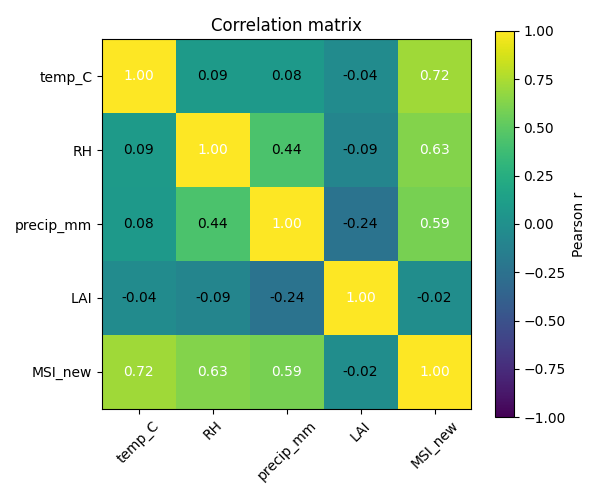

In [ ]:
from IPython.display import Image, display
import os

corr_matrix_path = os.path.join("/content/outbreak_analysis_outputs/plots_corr/", "correlation_matrix.png")

if os.path.exists(corr_matrix_path):
    display(Image(filename=corr_matrix_path))
else:
    print(f"Plot not found: {corr_matrix_path}")

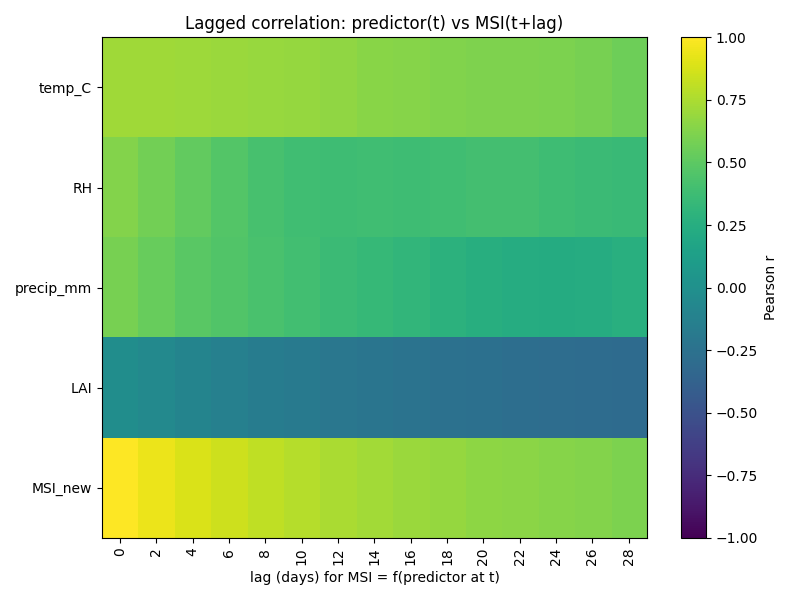

In [ ]:
from IPython.display import Image, display
import os

lagged_corr_heatmap_path = os.path.join("/content/outbreak_analysis_outputs/plots_corr/", "lagged_correlation_heatmap.png")

if os.path.exists(lagged_corr_heatmap_path):
    display(Image(filename=lagged_corr_heatmap_path))
else:
    print(f"Plot not found: {lagged_corr_heatmap_path}")

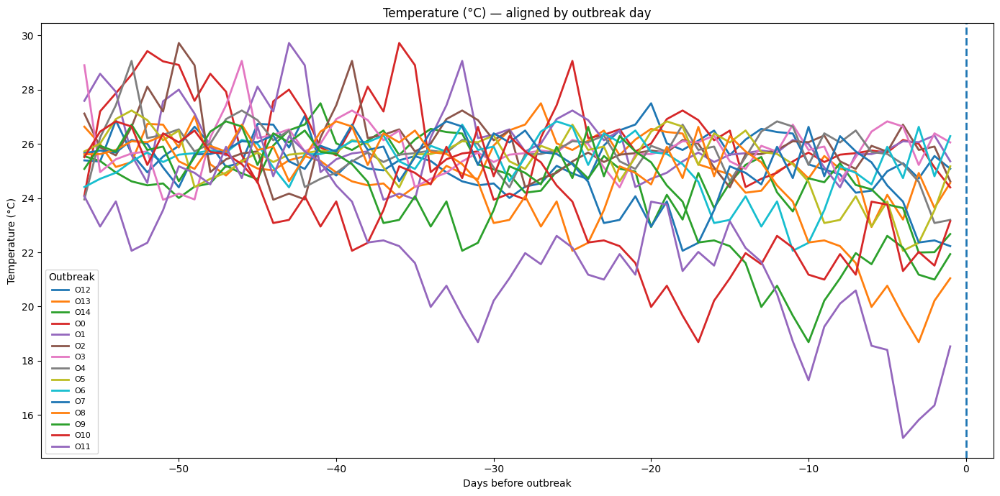

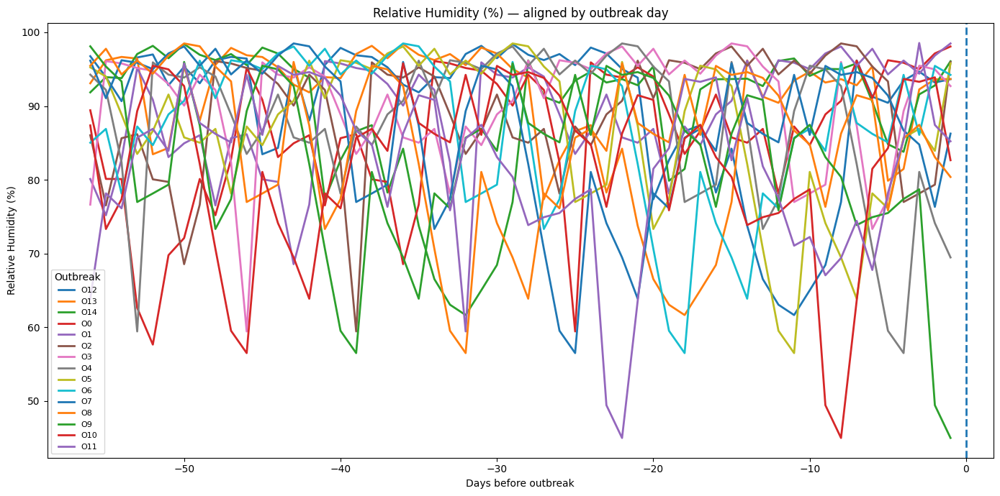

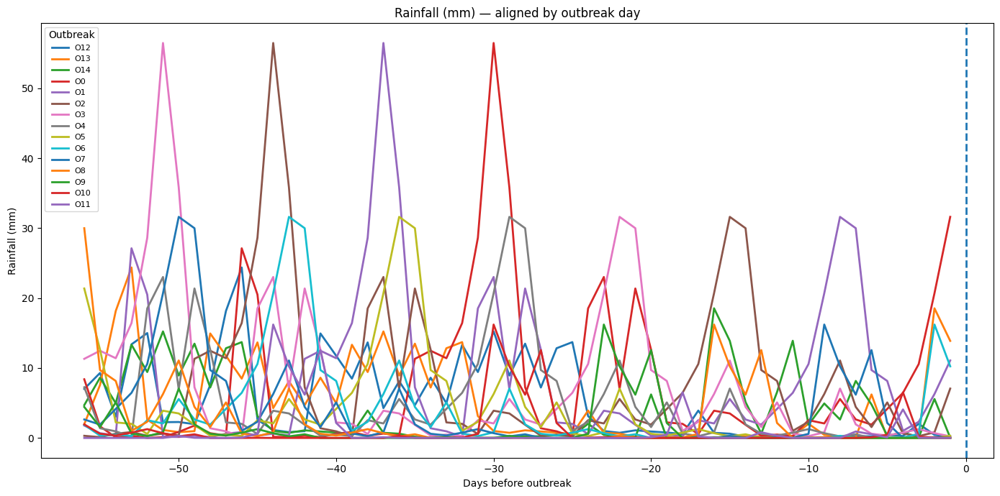

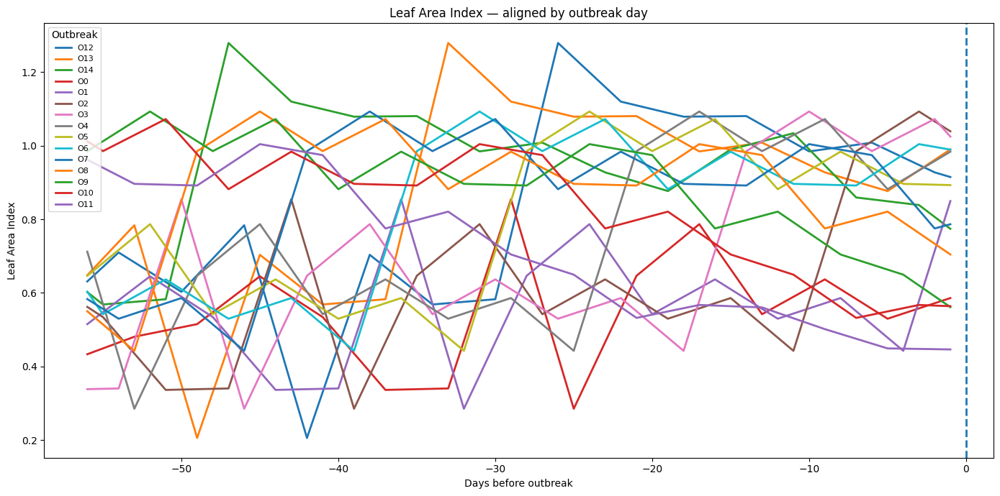

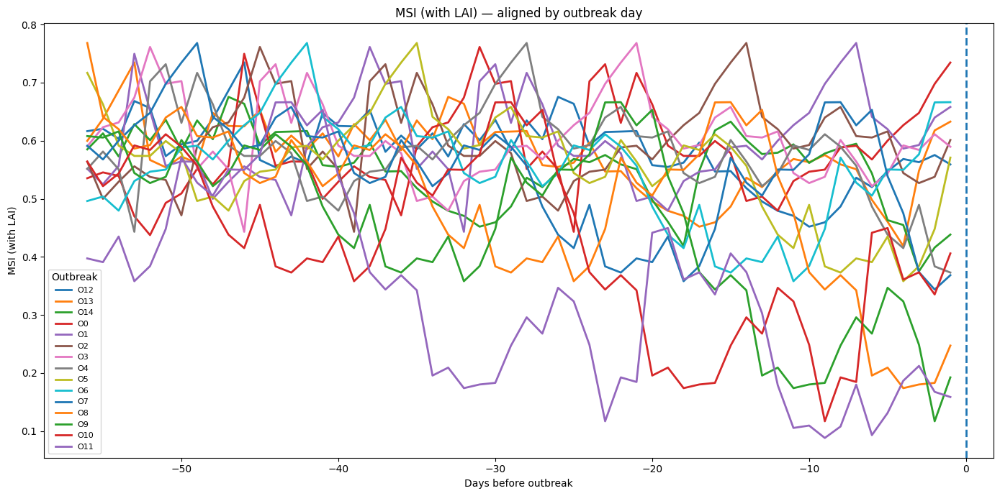

All aligned plots saved in folder: aligned_outbreak_plots/


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

df = pd.read_csv("/content/outbreak_analysis_outputs/final_with_LAI_MSI.csv", parse_dates=["time"])
df['outbreak_date'] = pd.to_datetime(df['outbreak_date'])

# Compute lag in days for each outbreak
df["lag_days"] = (df["time"] - df["outbreak_date"]).dt.days

# Keep only -56 to 0 days before outbreak
df = df[(df["lag_days"] >= -56) & (df["lag_days"] <= 0)]

# Ensure LAI filled
df["LAI"] = df["LAI"].astype(float).interpolate().bfill().ffill()

# Suitability calculations
def temp_suit(T): return np.clip(1 - ((T - 28) / 8)**2, 0, 1)
def rh_suit(r): return np.clip((r - 50) / 50, 0, 1)
def rain_suit(p): return np.clip(p / 30, 0, 1)
def lai_suit(l): return np.clip(l / 5, 0, 1)

df["temp_suit"] = temp_suit(df["temp_C"])
df["rh_suit"]   = rh_suit(df["RH"])
df["rain_suit"] = rain_suit(df["precip_mm"])
df["lai_suit"]  = lai_suit(df["LAI"])

df["MSI_new"] = (
    0.40*df["temp_suit"] +
    0.20*df["rh_suit"] +
    0.20*df["rain_suit"] +
    0.20*df["lai_suit"]
).clip(0,1)

# ================
# Plotting
# ================
os.makedirs("aligned_outbreak_plots", exist_ok=True)

params = {
    "temp_C": "Temperature (°C)",
    "RH": "Relative Humidity (%)",
    "precip_mm": "Rainfall (mm)",
    "LAI": "Leaf Area Index",
    "MSI_new": "MSI (with LAI)"
}

# One plot per parameter
for col, label in params.items():

    plt.figure(figsize=(14, 7))

    for oid in df["outbreak_idx"].unique():
        sub = df[df["outbreak_idx"] == oid]
        plt.plot(sub["lag_days"], sub[col], label=f"O{oid}", linewidth=2)

    plt.title(f"{label} — aligned by outbreak day")
    plt.xlabel("Days before outbreak")
    plt.ylabel(label)
    plt.axvline(0, linestyle="--", linewidth=2)  # outbreak day line
    plt.legend(title="Outbreak", fontsize=8)

    plt.tight_layout()
    plt.savefig(f"aligned_outbreak_plots/{col}_aligned.png")
    plt.show()
    plt.close()

print("All aligned plots saved in folder: aligned_outbreak_plots/")


In [ ]:
print("Date range:", df['time'].min(), "→", df['time'].max())
print("Unique outbreak dates:", df['outbreak_date'].unique())
print(df['outbreak_idx'].value_counts())


Date range: 2013-07-22 00:00:00 → 2015-11-01 00:00:00
Unique outbreak dates: <DatetimeArray>
['2013-09-16 00:00:00', '2013-09-23 00:00:00', '2013-10-07 00:00:00',
 '2015-08-10 00:00:00', '2015-08-17 00:00:00', '2015-08-24 00:00:00',
 '2015-08-31 00:00:00', '2015-09-07 00:00:00', '2015-09-14 00:00:00',
 '2015-09-21 00:00:00', '2015-09-28 00:00:00', '2015-10-05 00:00:00',
 '2015-10-12 00:00:00', '2015-10-19 00:00:00', '2015-11-02 00:00:00']
Length: 15, dtype: datetime64[ns]
outbreak_idx
12    56
13    56
14    56
0     56
1     56
2     56
3     56
4     56
5     56
6     56
7     56
8     56
9     56
10    56
11    56
Name: count, dtype: int64


Original length: 840
Final continuous length: 833
Total outbreak dates: 15
⚠ Skipped 2015-11-02 00:00:00 (length 56)
Positive windows: 14
Negative windows: 14
Dataset shape: (1596, 40)
X shape: (28, 57, 33)
y shape: (28,)
Epoch 1/80


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.5625 - loss: 0.7011 - val_accuracy: 0.4000 - val_loss: 0.6787
Epoch 2/80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.5625 - loss: 0.6635 - val_accuracy: 0.6000 - val_loss: 0.6730
Epoch 3/80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.5625 - loss: 0.6509 - val_accuracy: 0.6000 - val_loss: 0.6661
Epoch 4/80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.8750 - loss: 0.6195 - val_accuracy: 0.8000 - val_loss: 0.6589
Epoch 5/80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9375 - loss: 0.5936 - val_accuracy: 0.8000 - val_loss: 0.6521
Epoch 6/80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9375 - loss: 0.5751 - val_accuracy: 0.8000 - val_loss: 0.6464
Epoch 7/80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - accuracy: 0.7500 - loss: 0.5823 - val_accuracy: 0.8000 - val_loss: 0.6406
Epoch 8/80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.8125 - loss: 0.5649 - val_accuracy: 0.8000 - val_loss: 0.6345
Epoch 

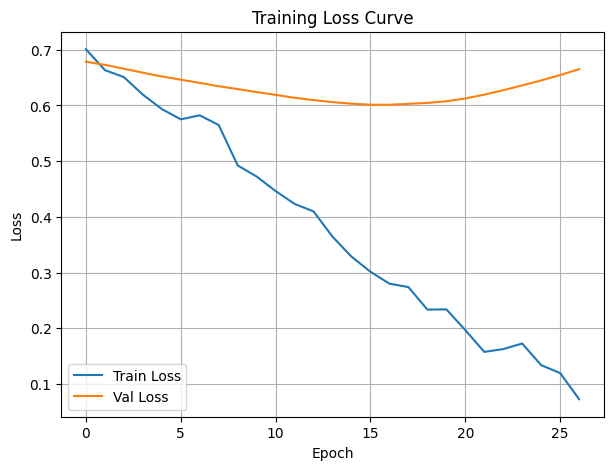

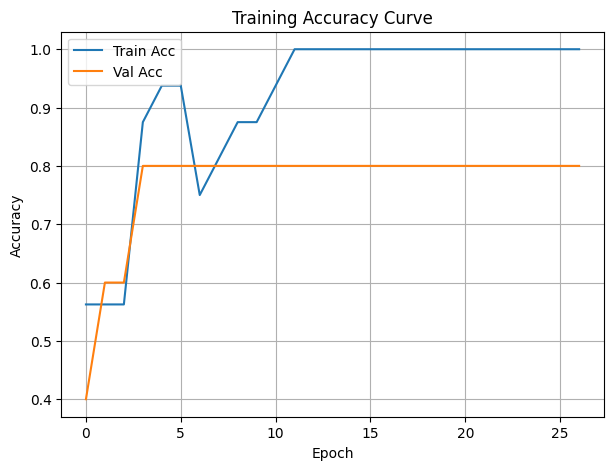

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


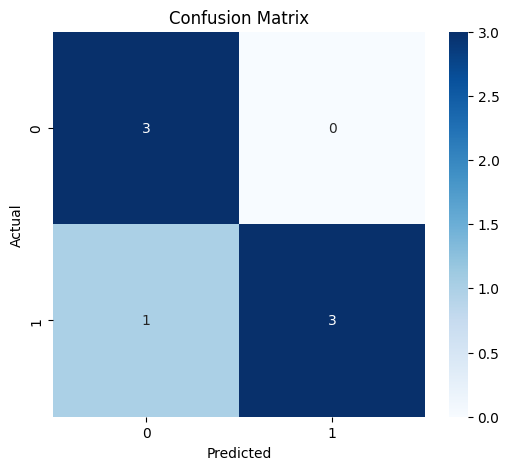

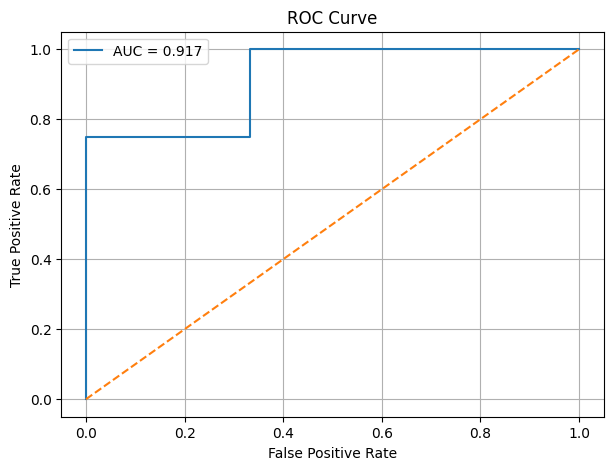


CLASSIFICATION REPORT
              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       1.00      0.75      0.86         4

    accuracy                           0.86         7
   macro avg       0.88      0.88      0.86         7
weighted avg       0.89      0.86      0.86         7


Sample Predictions:
True=0, Prob=0.159, Pred=0
True=1, Prob=0.862, Pred=1
True=0, Prob=0.145, Pred=0
True=1, Prob=0.787, Pred=1
True=1, Prob=0.173, Pred=0
True=0, Prob=0.213, Pred=0
True=1, Prob=0.611, Pred=1

Model saved as: /content/lstm_outbreak_model.h5


In [ ]:
# ====================================================================
# FULL LSTM PIPELINE WITH ALL PLOTS
# ====================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_curve, auc
)

import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# ============================================================
# 1) Load Data
# ============================================================

PATH = "/content/outbreak_analysis_outputs/final_with_LAI_MSI.csv"
df = pd.read_csv(PATH)

df["time"] = pd.to_datetime(df["time"])
print("Original length:", len(df))

# ============================================================
# 2) Remove Duplicates
# ============================================================

df = df.drop_duplicates(subset=["time"]).sort_values("time")

# ============================================================
# 3) Reindex to daily continuous timeline
# ============================================================

full_range = pd.date_range(df["time"].min(), df["time"].max(), freq="D")
df = df.set_index("time").reindex(full_range)
df.index.name = "time"
df = df.ffill()

print("Final continuous length:", len(df))

# ============================================================
# 4) Outbreak Dates
# ============================================================

OUTBREAK_DATES = pd.to_datetime([
    "2013-09-16","2013-09-23","2013-10-07",
    "2015-08-10","2015-08-17","2015-08-24","2015-08-31",
    "2015-09-07","2015-09-14","2015-09-21","2015-09-28",
    "2015-10-05","2015-10-12","2015-10-19","2015-11-02"
])

print("Total outbreak dates:", len(OUTBREAK_DATES))

# ============================================================
# 5) Build 56-Day Windows
# ============================================================

WINDOW = 56
pos_windows = []

for d in OUTBREAK_DATES:
    start = d - pd.Timedelta(days=WINDOW)
    if start < df.index.min():
        print(f"⚠ Skipped {d} (window incomplete)")
        continue

    window = df.loc[start:d]
    if len(window) != WINDOW + 1:
        print(f"⚠ Skipped {d} (length {len(window)})")
        continue

    win = window.copy()
    win["label"] = 1
    win["outbreak_date"] = d
    pos_windows.append(win)

print("Positive windows:", len(pos_windows))

# ============================================================
# 6) Negative Windows
# ============================================================

neg_windows = []
needed = len(pos_windows)
non_outbreak_days = df.index.difference(OUTBREAK_DATES)

for d in non_outbreak_days:
    if len(neg_windows) >= needed:
        break

    start = d - pd.Timedelta(days=WINDOW)
    if start < df.index.min():
        continue

    window = df.loc[start:d]
    if len(window) != WINDOW + 1:
        continue

    win = window.copy()
    win["label"] = 0
    win["outbreak_date"] = d
    neg_windows.append(win)

print("Negative windows:", len(neg_windows))

# ============================================================
# 7) Combine Dataset
# ============================================================

all_windows = pd.concat(pos_windows + neg_windows)
all_windows = all_windows.reset_index().rename(columns={"index": "time"})
all_windows = all_windows.sort_values(["outbreak_date", "time"])

print("Dataset shape:", all_windows.shape)

# ============================================================
# 8) Build LSTM Sequences
# ============================================================

SEQ_LEN = WINDOW + 1
X_seq, y_seq = [], []

for date, g in all_windows.groupby("outbreak_date"):

    g_num = g.select_dtypes(include=[np.number]).copy()
    g_num = g_num.drop(columns=["label"], errors="ignore")

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(g_num)

    if len(X_scaled) == SEQ_LEN:
        X_seq.append(X_scaled)
        y_seq.append(g["label"].iloc[0])

X = np.array(X_seq)
y = np.array(y_seq)

print("X shape:", X.shape)
print("y shape:", y.shape)

# ============================================================
# 9) Train-Test Split
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, shuffle=True, random_state=42
)

# ============================================================
# 10) Build LSTM Model
# ============================================================

model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(SEQ_LEN, X.shape[2])),
    Dropout(0.3),
    LSTM(32),
    Dropout(0.3),
    Dense(16, activation="relu"),
    Dense(1, activation="sigmoid")
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=80,
    batch_size=16,
    callbacks=[es],
    verbose=1
)

# ============================================================
# 11) PLOTS
# ============================================================

# ---- LOSS PLOT ----
plt.figure(figsize=(7,5))
plt.plot(history.history["loss"], label="Train Loss")
plt.plot(history.history["val_loss"], label="Val Loss")
plt.title("Training Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()

# ---- ACCURACY PLOT ----
plt.figure(figsize=(7,5))
plt.plot(history.history["accuracy"], label="Train Acc")
plt.plot(history.history["val_accuracy"], label="Val Acc")
plt.title("Training Accuracy Curve")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

# ============================================================
# 12) Predictions
# ============================================================

pred_probs = model.predict(X_test)
pred_labels = (pred_probs > 0.5).astype(int)

# ---- CONFUSION MATRIX ----
cm = confusion_matrix(y_test, pred_labels)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ---- ROC CURVE ----
fpr, tpr, thresholds = roc_curve(y_test, pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")
plt.plot([0,1], [0,1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid()
plt.show()

# ============================================================
# 13) Classification Report
# ============================================================

print("\nCLASSIFICATION REPORT")
print(classification_report(y_test, pred_labels))

print("\nSample Predictions:")
for i in range(len(y_test)):
    print(f"True={y_test[i]}, Prob={pred_probs[i][0]:.3f}, Pred={pred_labels[i][0]}")

# ============================================================
# 14) Save Model
# ============================================================

model.save("/content/lstm_outbreak_model.h5")
print("\nModel saved as: /content/lstm_outbreak_model.h5")


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 57, 64)         │        25,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 57, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 114,149 (445.90 KB)

 Trainable params: 38,049 (148.63 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 76,100 (297.27 KB)

Loaded: (840, 39)


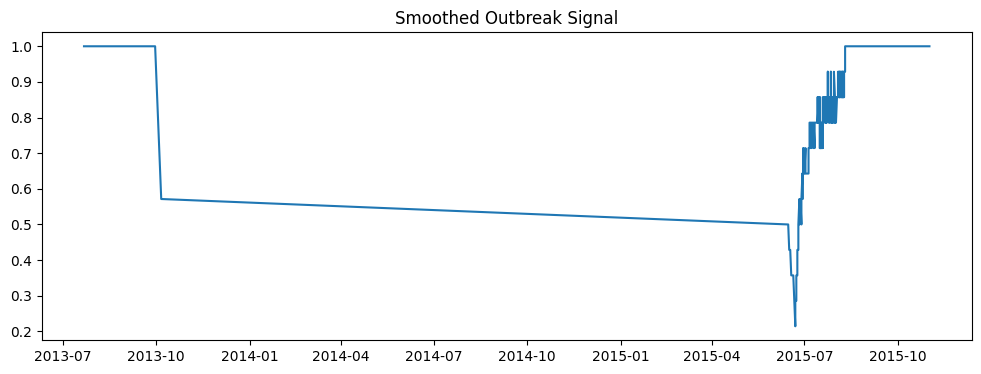



===== GRANGER CAUSALITY: temp_C → outbreak_smooth =====
Lag  1 → p = 0.98378
Lag  7 → p = 0.07781
Lag 14 → p = 0.00218
Lag 21 → p = 0.00099
Lag 30 → p = 0.00000


===== GRANGER CAUSALITY: RH → outbreak_smooth =====
Lag  1 → p = 0.62650
Lag  7 → p = 0.13610
Lag 14 → p = 0.13477
Lag 21 → p = 0.09479
Lag 30 → p = 0.11791


===== GRANGER CAUSALITY: precip_mm → outbreak_smooth =====
Lag  1 → p = 0.08155
Lag  7 → p = 0.00248
Lag 14 → p = 0.01113
Lag 21 → p = 0.04942
Lag 30 → p = 0.25634


===== GRANGER CAUSALITY: LAI → outbreak_smooth =====
Lag  1 → p = 0.36762
Lag  7 → p = 0.01487
Lag 14 → p = 0.00010
Lag 21 → p = 0.00042
Lag 30 → p = 0.00000


===== GRANGER CAUSALITY: MSI_new → outbreak_smooth =====
Lag  1 → p = 0.34407
Lag  7 → p = 0.07728
Lag 14 → p = 0.01756
Lag 21 → p = 0.04540
Lag 30 → p = 0.05542


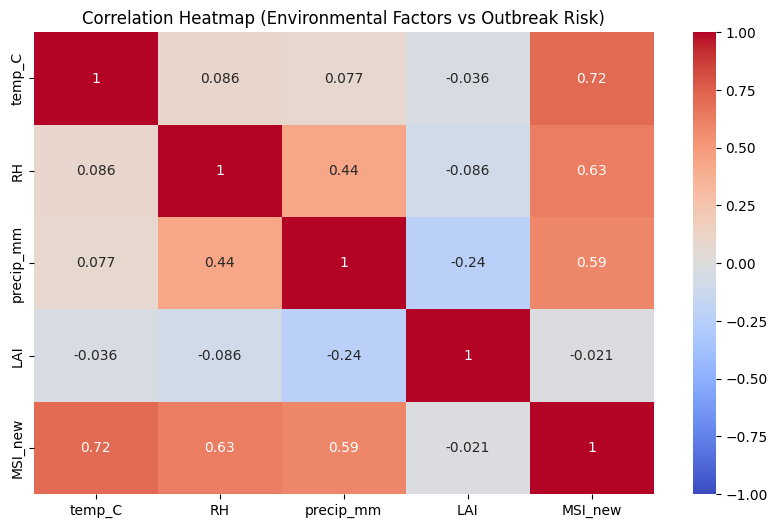

In [ ]:
# ============================================
# FULL CAUSALITY ANALYSIS PIPELINE
# ============================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests, ccf
import warnings
warnings.filterwarnings("ignore")

# ============================================
# 1) LOAD DATA
# ============================================
PATH = "/content/outbreak_analysis_outputs/final_with_LAI_MSI.csv"

df = pd.read_csv(PATH, parse_dates=["time"])
df = df.sort_values("time").reset_index(drop=True)

print("Loaded:", df.shape)

# outbreak_flag from outbreak_idx
df["outbreak_flag"] = (df["outbreak_idx"] > 0).astype(int)

# ============================================
# 2) SMOOTH OUTBREAK SIGNAL (required for Granger)
# ============================================
df["outbreak_smooth"] = (
    df["outbreak_flag"]
    .rolling(window=14, center=True, min_periods=1)
    .mean()
)

# Plot smoothed signal
plt.figure(figsize=(12,4))
plt.plot(df["time"], df["outbreak_smooth"])
plt.title("Smoothed Outbreak Signal")
plt.show()

# ============================================
# 3) CLEAN VARIABLES FOR ANALYSIS
# ============================================
causal_vars = ["temp_C", "RH", "precip_mm", "LAI", "MSI_new"]

for col in causal_vars:
    df[col] = df[col].interpolate().bfill().ffill()

# ============================================
# 4) GRANGER CAUSALITY FUNCTION
# ============================================
def run_granger(df, var, maxlag=30):

    print(f"\n\n===== GRANGER CAUSALITY: {var} → outbreak_smooth =====")

    data = df[["outbreak_smooth", var]].dropna()

    result = grangercausalitytests(data, maxlag=maxlag, verbose=False)

    for lag in [1, 7, 14, 21, 30]:
        if lag in result:
            p = result[lag][0]["ssr_chi2test"][1]
            print(f"Lag {lag:2d} → p = {p:.5f}")

# ============================================
# 5) RUN GRANGER FOR EACH VARIABLE
# ============================================
for var in causal_vars:
    run_granger(df, var)

# ============================================
# CORRELATION HEATMAP
# ============================================
heat_df = df[causal_vars ]

plt.figure(figsize=(10,6))
sns.heatmap(
    heat_df.corr(),
    annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1
)
plt.title("Correlation Heatmap (Environmental Factors vs Outbreak Risk)")
plt.show()
